In [1]:
#import library yang dibutuhkan
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import datasets
from sklearn.model_selection import train_test_split
import openpyxl
from statsmodels.tsa.seasonal import seasonal_decompose
from pandas_profiling import ProfileReport
from autots import AutoTS
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn import metrics 

In [2]:
#load dataset, disini ada 2 karena 1nya akan digunakan auto forecast dan satunya manual 
#dataset diambil dari historical data cryptocurrency coingecko.com
dfbaru = pd.read_csv('/Users/Adefebrian/solana.csv')
dfbaru
dfa = pd.read_csv('/Users/Adefebrian/solana.csv')
dfa

,Unnamed: 0,timestamp,open,high,low,close,volume,transparent_open,transparent_high,transparent_low,transparent_close,transparent_volume,volume_transparency.?,volume_transparency.A,volume_transparency.B,volume_transparency.C,volume_transparency.D
0,0,30/06/2022,34.167064,34.275418,31.860302,31.973495,996935171,34.080023,34.189626,31.744047,31.872639,3.378475e+08,5202810,337847511,10125,363787757,290086966
1,1,29/06/2022,35.437330,36.173124,33.219750,34.129223,2774137377,35.410375,36.156581,33.158458,34.098999,1.233982e+09,5774589,1233981738,25409512,1184385562,324585973
2,2,28/06/2022,38.650913,40.003332,35.230826,35.508627,2678288040,38.607985,39.981260,35.169955,35.455205,1.237931e+09,5977476,1237930666,27772327,1134957320,271650248
3,3,27/06/2022,39.539637,41.380372,38.047375,38.678655,2613223740,39.460918,41.333591,37.972590,38.599005,1.122611e+09,6059965,1122610874,25651344,1191416646,267484908
4,4,26/06/2022,42.379138,42.536188,39.237335,39.476612,2385119893,42.316641,42.454063,39.126412,39.367981,1.032491e+09,4795834,1032490556,23416192,1049232280,275185028
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,95,27/03/2022,101.997934,107.600193,99.262728,107.151271,2098684062,102.010011,107.636959,99.261126,107.212420,1.185357e+09,1658422,1185356944,44679706,531791269,335197719
96,96,26/03/2022,98.965294,103.805240,98.054973,102.110100,1692585958,98.963063,103.820350,98.039816,102.121771,9.800693e+08,1255416,980069275,37444367,426827650,246989248
97,97,25/03/2022,102.512811,105.112634,97.286469,98.857913,2840971580,102.565341,105.161833,97.270427,98.874350,1.738208e+09,2618110,1738208255,51618472,616247175,432279565
98,98,24/03/2022,95.039938,103.927810,93.688966,102.468428,3838052321,95.004250,103.898628,93.635810,102.499344,2.268357e+09,2925488,2268356934,56197884,942778295,567793717


In [3]:
#melihat dataframe variable dfbaru
dfbaru

,Unnamed: 0,timestamp,open,high,low,close,volume,transparent_open,transparent_high,transparent_low,transparent_close,transparent_volume,volume_transparency.?,volume_transparency.A,volume_transparency.B,volume_transparency.C,volume_transparency.D
0,0,30/06/2022,34.167064,34.275418,31.860302,31.973495,996935171,34.080023,34.189626,31.744047,31.872639,3.378475e+08,5202810,337847511,10125,363787757,290086966
1,1,29/06/2022,35.437330,36.173124,33.219750,34.129223,2774137377,35.410375,36.156581,33.158458,34.098999,1.233982e+09,5774589,1233981738,25409512,1184385562,324585973
2,2,28/06/2022,38.650913,40.003332,35.230826,35.508627,2678288040,38.607985,39.981260,35.169955,35.455205,1.237931e+09,5977476,1237930666,27772327,1134957320,271650248
3,3,27/06/2022,39.539637,41.380372,38.047375,38.678655,2613223740,39.460918,41.333591,37.972590,38.599005,1.122611e+09,6059965,1122610874,25651344,1191416646,267484908
4,4,26/06/2022,42.379138,42.536188,39.237335,39.476612,2385119893,42.316641,42.454063,39.126412,39.367981,1.032491e+09,4795834,1032490556,23416192,1049232280,275185028
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,95,27/03/2022,101.997934,107.600193,99.262728,107.151271,2098684062,102.010011,107.636959,99.261126,107.212420,1.185357e+09,1658422,1185356944,44679706,531791269,335197719
96,96,26/03/2022,98.965294,103.805240,98.054973,102.110100,1692585958,98.963063,103.820350,98.039816,102.121771,9.800693e+08,1255416,980069275,37444367,426827650,246989248
97,97,25/03/2022,102.512811,105.112634,97.286469,98.857913,2840971580,102.565341,105.161833,97.270427,98.874350,1.738208e+09,2618110,1738208255,51618472,616247175,432279565
98,98,24/03/2022,95.039938,103.927810,93.688966,102.468428,3838052321,95.004250,103.898628,93.635810,102.499344,2.268357e+09,2925488,2268356934,56197884,942778295,567793717


In [4]:
#melihat informasi dataset
dfa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             100 non-null    int64  
 1   timestamp              100 non-null    object 
 2   open                   100 non-null    float64
 3   high                   100 non-null    float64
 4   low                    100 non-null    float64
 5   close                  100 non-null    float64
 6   volume                 100 non-null    int64  
 7   transparent_open       100 non-null    float64
 8   transparent_high       100 non-null    float64
 9   transparent_low        100 non-null    float64
 10  transparent_close      100 non-null    float64
 11  transparent_volume     100 non-null    float64
 12  volume_transparency.?  100 non-null    int64  
 13  volume_transparency.A  100 non-null    int64  
 14  volume_transparency.B  100 non-null    int64  
 15  volume_

In [5]:
#melihat informasi data kolom variable dfa
dfa.describe()

,Unnamed: 0,open,high,low,close,volume,transparent_open,transparent_high,transparent_low,transparent_close,transparent_volume,volume_transparency.?,volume_transparency.A,volume_transparency.B,volume_transparency.C,volume_transparency.D
count,100.000000,100.000000,100.000000,100.000000,100.000000,1.000000e+02,100.000000,100.000000,100.000000,100.000000,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02
mean,49.500000,72.122315,75.384957,68.394555,71.541498,3.778629e+09,71.975890,75.299911,68.202449,71.395790,1.514372e+09,4.839159e+06,1.514372e+09,3.862896e+07,1.779272e+09,4.415167e+08
std,29.011492,32.808397,34.021509,32.213347,32.995133,1.569886e+09,32.723740,33.983823,32.110199,32.913186,6.702604e+08,2.580970e+06,6.702604e+08,2.022869e+07,9.119207e+08,1.724309e+08
min,0.000000,28.636124,31.108991,25.943101,28.647610,9.969352e+08,28.653104,31.076870,25.914758,28.659584,3.378475e+08,1.224087e+06,3.378475e+08,1.012500e+04,3.637878e+08,2.174545e+08
25%,24.750000,40.794024,42.771735,38.414381,40.290369,2.674305e+09,40.747296,42.707556,38.351716,40.177915,1.029571e+09,2.593506e+06,1.029571e+09,2.559089e+07,1.231629e+09,3.150478e+08
50%,49.500000,60.736815,64.099048,52.679261,58.059263,3.498531e+09,60.644023,63.978356,52.639235,58.098753,1.393264e+09,4.730934e+06,1.393264e+09,3.248952e+07,1.575847e+09,3.837882e+08
75%,74.250000,101.468508,104.101461,99.160962,101.598371,4.044903e+09,101.252708,103.851684,98.640870,101.450983,1.716190e+09,6.290481e+06,1.716190e+09,4.603660e+07,2.087084e+09,5.194081e+08
max,99.000000,137.164806,143.681963,132.007165,137.268522,1.000895e+10,137.120200,143.720342,131.835780,137.162166,3.717743e+09,1.229814e+07,3.717743e+09,1.037983e+08,6.426648e+09,1.045711e+09


In [6]:
#handling missing values 
dfa.isnull()

,Unnamed: 0,timestamp,open,high,low,close,volume,transparent_open,transparent_high,transparent_low,transparent_close,transparent_volume,volume_transparency.?,volume_transparency.A,volume_transparency.B,volume_transparency.C,volume_transparency.D
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
96,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
97,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
98,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [7]:
#mengahapus kolom yang tidak dibutuhkan dan juga menghapus slash untuk processing dengan scaler
dfa.drop(columns=['Unnamed: 0', 'transparent_open', 'transparent_high', 'transparent_low', 'transparent_close', 'transparent_volume', 'volume_transparency.?', 'volume_transparency.A', 'volume_transparency.B', 'volume_transparency.C', 'volume_transparency.D'], axis=1, inplace=True)
dfa = dfa.replace(to_replace= r'/', value= '', regex=True)
dfbaru.drop(columns=['Unnamed: 0', 'transparent_open', 'transparent_high', 'transparent_low', 'transparent_close', 'transparent_volume', 'volume_transparency.?', 'volume_transparency.A', 'volume_transparency.B', 'volume_transparency.C', 'volume_transparency.D'], axis=1, inplace=True)

In [8]:
dfbaru

,timestamp,open,high,low,close,volume
0,30/06/2022,34.167064,34.275418,31.860302,31.973495,996935171
1,29/06/2022,35.437330,36.173124,33.219750,34.129223,2774137377
2,28/06/2022,38.650913,40.003332,35.230826,35.508627,2678288040
3,27/06/2022,39.539637,41.380372,38.047375,38.678655,2613223740
4,26/06/2022,42.379138,42.536188,39.237335,39.476612,2385119893
...,...,...,...,...,...,...
95,27/03/2022,101.997934,107.600193,99.262728,107.151271,2098684062
96,26/03/2022,98.965294,103.805240,98.054973,102.110100,1692585958
97,25/03/2022,102.512811,105.112634,97.286469,98.857913,2840971580
98,24/03/2022,95.039938,103.927810,93.688966,102.468428,3838052321


In [36]:
dfa

,timestamp,open,high,low,close,volume
0,30062022,34.167064,34.275418,31.860302,31.973495,996935171
1,29062022,35.437330,36.173124,33.219750,34.129223,2774137377
2,28062022,38.650913,40.003332,35.230826,35.508627,2678288040
3,27062022,39.539637,41.380372,38.047375,38.678655,2613223740
4,26062022,42.379138,42.536188,39.237335,39.476612,2385119893
...,...,...,...,...,...,...
95,27032022,101.997934,107.600193,99.262728,107.151271,2098684062
96,26032022,98.965294,103.805240,98.054973,102.110100,1692585958
97,25032022,102.512811,105.112634,97.286469,98.857913,2840971580
98,24032022,95.039938,103.927810,93.688966,102.468428,3838052321


In [9]:
#melakukan automatic eda
profile = ProfileReport(dfbaru)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [39]:
#melakukan penghitungan regresi 
from sklearn.linear_model import LinearRegression
X = dfa['open'].values
X
Y = dfa['close'].values
Y

array([ 31.97349452,  34.12922336,  35.50862744,  38.67865498,
        39.47661236,  42.44932304,  41.93609725,  38.24223728,
        34.22541715,  36.47316833,  35.28460102,  34.27412096,
        32.04020778,  30.82301964,  30.22415602,  34.70545322,
        29.63130225,  28.64761019,  30.78200512,  34.13477721,
        37.34004125,  40.07358477,  39.00941787,  39.47059218,
        42.49798319,  38.76412763,  39.16612836,  38.41792163,
        40.95449297,  40.36263103,  45.86675305,  47.25892851,
        45.13015381,  44.49886704,  41.29881167,  43.60914767,
        48.31736952,  49.86029339,  49.35738971,  52.812923  ,
        50.76217849,  49.7379497 ,  52.28013082,  50.22079714,
        57.12199764,  53.94628258,  58.99652879,  52.703397  ,
        49.16841526,  45.15555319,  51.0864821 ,  67.15905965,
        62.66147004,  75.86571974,  79.55378131,  82.30663362,
        85.14463388,  92.69109631,  86.18726921,  87.90479273,
        90.20251103,  85.71957126,  94.36628213,  98.71

In [40]:
#menampilkan hasil regresi antara variabel X dan Y 
X_test = X.reshape(-1,1)
Y_test = Y.reshape(-1,1)
model = LinearRegression()
model.fit(X_test,Y_test)
total = model.score(X_test,Y_test)
total 

0.9802311028519867

In [41]:
#melihat inercept dari regresi X dan Y
regressor = LinearRegression()
regressor.fit(X_test, Y_test)
regressor.intercept_

array([-0.27078915])

In [42]:
#melihat coef dari regresi X dan Y
regressor = LinearRegression()
regressor.fit(X_test, Y_test)
regressor.coef_

array([[0.99570137]])

In [10]:
#melakukan spliting dataset menjadi 2 bagian yaitu training dan testing, dari 100 data dibagi 0.5
#namun data train dan testing ini masih blm terlalu kami pakai namun untuk berjaga-jaga untuk pengembangan selanjutnya kami tetap menambahkanya
X = dfa.iloc[1:]
y = dfa.iloc[1:]
 
# split the dataset
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3)

In [11]:
#melihat jumlah kolom pada test
X_test.shape

(30, 6)

In [12]:
#melihat jumlah kolom pada train
X_train.shape

(69, 6)

In [13]:
#Mendefiniskan variabel untuk scaler
df_scaled = dfa.copy()
col_names =df_scaled.columns
features = df_scaled[col_names]


In [14]:
#Mendifinisikan model minmax scaler untuk mentranform data 
#untuk membuat minmax scaler disini kami memanfaatkan sklearn 
from sklearn.preprocessing import MinMaxScaler
df_MinMaxScaler = dfa.copy()

scaler = MinMaxScaler()
df_MinMaxScaler[col_names] = scaler.fit_transform(features.values)
df_MinMaxScaler.describe()

,timestamp,open,high,low,close,volume
count,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
mean,0.523099,0.400688,0.393309,0.400244,0.394895,0.308665
std,0.301182,0.302302,0.302217,0.303716,0.303764,0.174199
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.266828,0.112025,0.103602,0.117583,0.107187,0.186126
50%,0.533655,0.295781,0.293055,0.252076,0.270773,0.277585
75%,0.799484,0.671089,0.648401,0.690317,0.671609,0.338212
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [15]:
#melakukan automatic EDA kembali namun kali ini menggunakan variabel minmax scaler
profil = ProfileReport(df_MinMaxScaler)
profil

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [45]:
#Melihat korelasi dari minmax scaler
#dan bisa kita lihat sekarang jika timestamp masuk kedalam korelasi namun memiliki nilai yang rendah untuk korelasi terkuatnya sendiri terdapat pada kolom close
correlation = df_MinMaxScaler.corr()
correlation


,timestamp,open,high,low,close,volume,scores,anomaly
timestamp,1.000000,-0.130591,-0.132013,-0.107141,-0.111798,-0.180207,0.359828,0.344273
open,-0.130591,1.000000,0.996271,0.993609,0.990066,0.423542,-0.205739,-0.294192
high,-0.132013,0.996271,1.000000,0.993517,0.995166,0.459530,-0.222641,-0.305632
low,-0.107141,0.993609,0.993517,1.000000,0.996341,0.389467,-0.174211,-0.261820
close,-0.111798,0.990066,0.995166,0.996341,1.000000,0.423596,-0.186298,-0.275461
volume,-0.180207,0.423542,0.459530,0.389467,0.423596,1.000000,-0.571146,-0.589005
scores,0.359828,-0.205739,-0.222641,-0.174211,-0.186298,-0.571146,1.000000,0.815750
anomaly,0.344273,-0.294192,-0.305632,-0.261820,-0.275461,-0.589005,0.815750,1.000000


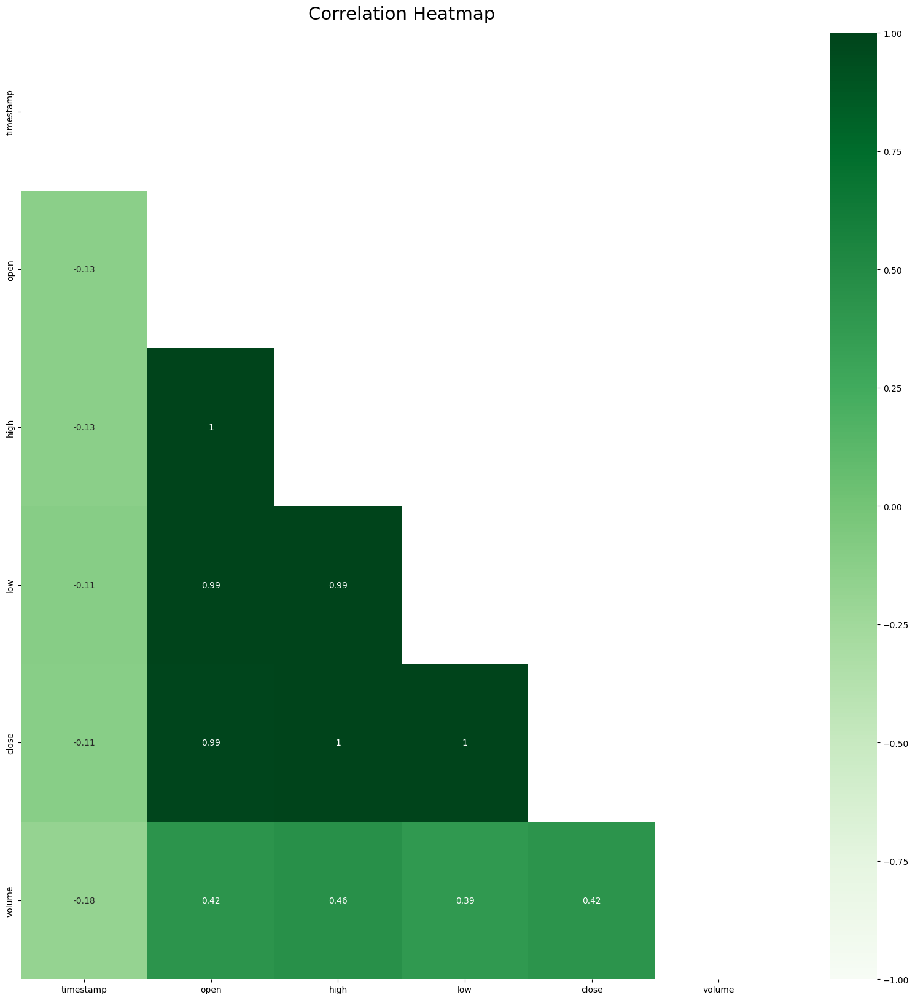

In [17]:
#untuk melihat korelasi dengan jelas disini kami menggunakan heatmap dari seaborn dan melakukan sedikit styling agar lebih mudah untuk dibaca
plt.subplots(figsize=(20,20))
mask = np.triu(np.ones_like(df_MinMaxScaler.corr()))
heatmap = sns.heatmap(df_MinMaxScaler.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='Greens')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':21}, pad=16);

In [49]:
#untuk melakukan autoforecasting dengan berbagai model secara otomatis kami memanfaatkan library autots 
from autots import AutoTS
model = AutoTS(forecast_length=10, 
    frequency='infer',
    prediction_interval=0.6,
    ensemble=None,
    model_list="fast_parallel", 
    transformer_list="superfast", 
    drop_most_recent=1)
model = model.fit(dfbaru, date_col='timestamp',
    value_col='low')

#diatas adalah kode default yang diberikan oleh autots yang dapat kita implementasikan
#namun dapat kita baca jika forecastingnya hanya berjarak 10 hari kedepan dengan interval 0.6 
#lalu untuk modelnya sendri disini kami menggunakan automatic fiting model, jadi akan menyesuaikan dengan data kami
#tetapi kodenya bisa kami explorasi dengan memilih beberapa model saja contohnya seperti ARIMA dan ARDL
#untuk kolomnya disini kami memanfaatkan timestamp sebagai X dan kolom low sebagai Y

Inferred frequency is: D
Model Number: 1 with model ARIMA in generation 0 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           12     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.93206D+00    |proj g|=  2.42691D-01

At iterate    1    f=  2.82731D+00    |proj g|=  1.06001D-01

At iterate    2    f=  2.81645D+00    |proj g|=  4.74086D-02

At iterate    3    f=  2.81262D+00    |proj g|=  3.83576D-02

At iterate    4    f=  2.81075D+00    |proj g|=  3.14128D-02

At iterate    5    f=  2.80635D+00    |proj g|=  3.23392D-02

At iterate    6    f=  2.80541D+00    |proj g|=  2.34583D-02

At iterate    7    f=  2.80467D+00    |proj g|=  1.14508D-02

At iterate    8    f=  2.80431D+00    |proj g|=  6.38665D-03

At iterate    9    f=  2.80387D+00    |proj g|=  8.22350D-03

At iterate   10    f=  2.80247D+00    |proj g|=  1.96238D-02

At iterate   11    f=  2.80175D+00    |proj g|=  2.86252D-02

At itera

 This problem is unconstrained.



At iterate   33    f=  2.78971D+00    |proj g|=  9.33567D-03

At iterate   34    f=  2.78966D+00    |proj g|=  7.68876D-03

At iterate   35    f=  2.78963D+00    |proj g|=  4.22809D-03

At iterate   36    f=  2.78960D+00    |proj g|=  4.00359D-03

At iterate   37    f=  2.78954D+00    |proj g|=  4.41874D-03

At iterate   38    f=  2.78952D+00    |proj g|=  8.29070D-03

At iterate   39    f=  2.78947D+00    |proj g|=  2.01820D-02

At iterate   40    f=  2.78946D+00    |proj g|=  2.34600D-02

At iterate   41    f=  2.78944D+00    |proj g|=  3.29914D-03

At iterate   42    f=  2.78944D+00    |proj g|=  3.15201D-03

At iterate   43    f=  2.78943D+00    |proj g|=  1.37266D-03

At iterate   44    f=  2.78942D+00    |proj g|=  4.71779D-03

At iterate   45    f=  2.78942D+00    |proj g|=  2.52796D-03

At iterate   46    f=  2.78941D+00    |proj g|=  6.73889D-04

At iterate   47    f=  2.78941D+00    |proj g|=  8.81862D-04

At iterate   48    f=  2.78941D+00    |proj g|=  5.86033D-04

At iter

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.98462D+00    |proj g|=  2.94833D-01

At iterate    1    f=  2.84185D+00    |proj g|=  1.43682D-01

At iterate    2    f=  2.82298D+00    |proj g|=  9.41635D-02

At iterate    3    f=  2.81228D+00    |proj g|=  7.46228D-02

At iterate    4    f=  2.80418D+00    |proj g|=  5.10153D-02

At iterate    5    f=  2.79672D+00    |proj g|=  5.92718D-02

At iterate    6    f=  2.79127D+00    |proj g|=  4.37652D-02

At iterate    7    f=  2.78868D+00    |proj g|=  1.98667D-02

At iterate    8    f=  2.78738D+00    |proj g|=  1.39078D-02

At iterate    9    f=  2.78610D+00    |proj g|=  1.46114D-02

At iterate   10    f=  2.78362D+00    |proj g|=  7.18857D-02

At iterate   11    f=  2.78212D+00    |proj g|=  5.12291D-02

At iterate   12    f=  2.78053D+00    |proj g|=  1.75485D-02

At iterate   13    f=  2.7

 This problem is unconstrained.



At iterate   18    f=  2.77877D+00    |proj g|=  4.63815D-03

At iterate   19    f=  2.77874D+00    |proj g|=  3.68621D-03

At iterate   20    f=  2.77867D+00    |proj g|=  5.93997D-03

At iterate   21    f=  2.77855D+00    |proj g|=  8.00730D-03

At iterate   22    f=  2.77810D+00    |proj g|=  2.08106D-02

At iterate   23    f=  2.77798D+00    |proj g|=  1.94142D-02

At iterate   24    f=  2.77753D+00    |proj g|=  3.08643D-02

At iterate   25    f=  2.77650D+00    |proj g|=  6.69837D-02

At iterate   26    f=  2.77620D+00    |proj g|=  4.94246D-02

At iterate   27    f=  2.77603D+00    |proj g|=  4.57135D-02

At iterate   28    f=  2.77539D+00    |proj g|=  2.30422D-02

At iterate   29    f=  2.77498D+00    |proj g|=  3.59272D-02

At iterate   30    f=  2.77391D+00    |proj g|=  3.22562D-02

At iterate   31    f=  2.77210D+00    |proj g|=  4.76957D-02

At iterate   32    f=  2.77093D+00    |proj g|=  4.18567D-02

At iterate   33    f=  2.76929D+00    |proj g|=  6.06088D-02

At iter

/opt/homebrew/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 10 with model DatepartRegression in generation 0 of 10
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 10: DatepartRegression
Model Number: 11 with model ETS in generation 0 of 10
Model Number: 12 with model ETS in generation 0 of 10
Model Number: 13 with model GLM in generation 0 of 10
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 13: GLM
Model Number: 14 with model GLM in generation 0 of 10
Model Number: 15 with model GLS in generation 0 of 10
Model Number: 16 with model GLS in generation 0 of 10
Model Number: 17 with model LastValueNaive in generation 0 of 10
Model Number: 18 with model LastValueNaive in generation 0 of 10
Model Number: 19 with model LastValueNaive in generation 0 of 10
Model Number: 20 with model LastValueNaive in generation 0 of 10
Model Nu

/opt/homebrew/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 22 with model SeasonalNaive in generation 0 of 10
Model Number: 23 with model SeasonalNaive in generation 0 of 10
Model Number: 24 with model UnobservedComponents in generation 0 of 10
Model Number: 25 with model UnobservedComponents in generation 0 of 10
Model Number: 26 with model UnobservedComponents in generation 0 of 10
Model Number: 27 with model VAR in generation 0 of 10
Template Eval Error: ValueError('Only gave one variable to VAR') in model 27: VAR
Model Number: 28 with model VAR in generation 0 of 10
Template Eval Error: ValueError('Only gave one variable to VAR') in model 28: VAR
Model Number: 29 with model VECM in generation 0 of 10
Template Eval Error: ValueError('Only gave one variable to VECM') in model 29: VECM
Model Number: 30 with model VECM in generation 0 of 10
Template Eval Error: ValueError('Only gave one variable to VECM') in model 30: VECM
Model Number: 31 with model WindowRegression in generation 0 of 10
Model Number: 32 with model ConstantNaive 

/opt/homebrew/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 37 with model UnobservedComponents in generation 0 of 10
Model Number: 38 with model UnobservedComponents in generation 0 of 10
Model Number: 39 with model ETS in generation 0 of 10
Model Number: 40 with model VECM in generation 0 of 10
Template Eval Error: ValueError('Only gave one variable to VECM') in model 40: VECM
Model Number: 41 with model ARDL in generation 0 of 10
Model Number: 42 with model MultivariateMotif in generation 0 of 10
Model Number: 43 with model MultivariateMotif in generation 0 of 10
Model Number: 44 with model UnivariateMotif in generation 0 of 10
Model Number: 45 with model UnivariateMotif in generation 0 of 10
Model Number: 46 with model SectionalMotif in generation 0 of 10
Model Number: 47 with model SectionalMotif in generation 0 of 10
Model Number: 48 with model FBProphet in generation 0 of 10
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 48: FBProphet
Model Number: 49 with model SeasonalNaive in generation 0

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=-2)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 100 out of 100 | elapsed:    0.0s finished
 This problem is unconstrained.
 This problem is unconstrained.


Model Number: 55 with model FBProphet in generation 0 of 10
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 55: FBProphet
Model Number: 56 with model ARIMA in generation 0 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.03590D-01    |proj g|=  1.43116D+01

At iterate    1    f=  1.38405D-01    |proj g|=  1.96041D+00

At iterate    2    f= -3.51282D-01    |proj g|=  9.45674D-01

At iterate    3    f= -6.93826D-01    |proj g|=  4.23062D+00

At iterate    4    f= -1.12042D+00    |proj g|=  7.90914D+00

At iterate    5    f= -1.78575D+00    |proj g|=  2.75536D+00

At iterate    6    f= -1.79467D+00    |proj g|=  4.46976D+00

At iterate    7    f= -1.84171D+00    |proj g|=  1.27617D+00

At iterate    8    f= -1.85997D+00    |proj g|=  2.16339D+00

At iterate    9    f= -1.86196D+00    |proj g|=  5.13268D-01

A

/opt/homebrew/lib/python3.9/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)



Template Eval Error: ValueError('Only gave one variable to VAR') in model 70: VAR
Model Number: 71 with model VECM in generation 0 of 10
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 71: VECM
Model Number: 72 with model WindowRegression in generation 0 of 10
Model Number: 73 with model DatepartRegression in generation 0 of 10
Model Number: 74 with model SectionalMotif in generation 0 of 10
Model Number: 75 with model NVAR in generation 0 of 10
Model Number: 76 with model ARIMA in generation 0 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.85861D+00    |proj g|=  1.27709D-02

At iterate    1    f=  2.85830D+00    |proj g|=  6.45843D-03

At iterate    2    f=  2.85820D+00    |proj g|=  4.94897D-03

At iterate    3    f=  2.85812D+00    |proj g|=  3.12428D-03

At iterate    4    f=  2.

 This problem is unconstrained.


Model Number: 81 with model ARIMA in generation 0 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.05904D+00    |proj g|=  1.37744D-02

At iterate    1    f=  3.44688D+00    |proj g|=  4.52567D-02

At iterate    2    f=  3.36748D+00    |proj g|=  2.73948D-02

At iterate    3    f=  3.36714D+00    |proj g|=  1.98583D-02

At iterate    4    f=  3.35979D+00    |proj g|=  4.98192D-03

At iterate    5    f=  3.35944D+00    |proj g|=  1.38168D-03

At iterate    6    f=  3.35941D+00    |proj g|=  6.93301D-05

At iterate    7    f=  3.35941D+00    |proj g|=  9.01501D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm

 This problem is unconstrained.
/opt/homebrew/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.581e+03, tolerance: 8.516e+00
  model = cd_fast.enet_coordinate_descent(


Model Number: 92 with model VAR in generation 0 of 10
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model ConstantNaive in generation 0 of 10
Model Number: 94 with model MultivariateMotif in generation 0 of 10
Model Number: 95 with model ConstantNaive in generation 0 of 10
Model Number: 96 with model GLM in generation 0 of 10
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 96: GLM
Model Number: 97 with model MultivariateMotif in generation 0 of 10
Model Number: 98 with model UnivariateMotif in generation 0 of 10
Model Number: 99 with model VAR in generation 0 of 10
Template Eval Error: ValueError('Only gave one variable to VAR') in model 99: VAR
Model Number: 100 with model DatepartRegression in generation 0 of 10


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=-2)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 186 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 436 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 786 tasks      | elapsed:    0.4s


Model Number: 101 with model VECM in generation 0 of 10
Template Eval Error: ValueError('Only gave one variable to VECM') in model 101: VECM
Model Number: 102 with model SectionalMotif in generation 0 of 10
Model Number: 103 with model Theta in generation 0 of 10
Model Number: 104 with model DatepartRegression in generation 0 of 10
Model Number: 105 with model SectionalMotif in generation 0 of 10
Model Number: 106 with model LastValueNaive in generation 0 of 10


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.6s finished
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 436 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 786 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 1000 out of 1000 | elapsed:    0.0s finished


Model Number: 107 with model Theta in generation 0 of 10
Model Number: 108 with model DatepartRegression in generation 0 of 10
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 108: DatepartRegression
Model Number: 109 with model VECM in generation 0 of 10
Template Eval Error: ValueError('Only gave one variable to VECM') in model 109: VECM
Model Number: 110 with model ETS in generation 0 of 10
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on low with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 111 with model VECM in generation 0 of 10
Template Eval Error: ValueError('Only gave one variable to VECM') in model 111: VECM
Model Number: 112 with model DatepartRegression in generation 0 of 10
Model Number: 113 with model NVAR in generation 0 of 10
Model Number: 114 with model SeasonalNaive in generat

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           14     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.61014D+00    |proj g|=  6.41685D+00

At iterate    1    f= -1.62365D+00    |proj g|=  9.40199D-01

At iterate    2    f= -1.62412D+00    |proj g|=  2.59056D-01

At iterate    3    f= -1.62424D+00    |proj g|=  1.47910D-01

At iterate    4    f= -1.62436D+00    |proj g|=  2.57040D-01

At iterate    5    f= -1.62488D+00    |proj g|=  7.54529D-01

At iterate    6    f= -1.62573D+00    |proj g|=  1.14328D+00

At iterate    7    f= -1.62704D+00    |proj g|=  1.15184D+00

At iterate    8    f= -1.63024D+00    |proj g|=  1.21837D+00

At iterate    9    f= -1.63892D+00    |proj g|=  9.31575D-01

At iterate   10    f= -1.64171D+00    |proj g|=  1.74403D-01

At iterate   11    f= -1.64231D+00    |proj g|=  1.75501D-01

At iterate   12    f= -1.64240D+00    |proj g|=  1.87918D-01

At iterate   13    f= -1.6

/opt/homebrew/lib/python3.9/site-packages/numpy/lib/function_base.py:550: RuntimeWarning: invalid value encountered in divide
  avg = np.multiply(a, wgt,


Model Number: 159 with model LastValueNaive in generation 0 of 10
Model Number: 160 with model ARDL in generation 0 of 10
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 160: ARDL
Model Number: 161 with model ARIMA in generation 0 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.86425D-01    |proj g|=  3.10610D-01

At iterate    1    f= -8.86641D-01    |proj g|=  1.05634D-01

At iterate    2    f= -8.86669D-01    |proj g|=  1.00417D-02

At iterate    3    f= -8.86697D-01    |proj g|=  2.31379D-02

At iterate    4    f= -8.86846D-01    |proj g|=  9.67398D-02

At iterate    5    f= -8.86901D-01    |proj g|=  6.24735D-02

At iterate    6    f= -8.86932D-01    |proj g|=  1.44164D-02

At iterate    7    f= -8.86952D-01    |proj g|=  4.15534D-02

At iterate    8    f= -8.86975D-01    |proj g|

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.



At iterate   40    f= -8.91435D-01    |proj g|=  3.15247D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    8     40     79      2     0     0   3.152D-04  -8.914D-01
  F = -0.89143486226700086     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Model Number: 162 with model SeasonalNaive in generation 0 of 10
Model Number: 163 with model WindowRegression in generation 0 of 10
New Generation: 1 of 10
Model Number: 164 with model UnivariateMotif in generation 1 of 10
Model Number: 165 with model UnobservedComponents in generation 1 of 10
Model Number: 166 with model ARIMA in generation 1 of 10
RUNNING 

 This problem is unconstrained.



At iterate   31    f= -1.08386D+00    |proj g|=  4.45601D-02

At iterate   32    f= -1.08399D+00    |proj g|=  2.20537D-02

At iterate   33    f= -1.08414D+00    |proj g|=  1.75816D-02

At iterate   34    f= -1.08478D+00    |proj g|=  6.33405D-02

At iterate   35    f= -1.08503D+00    |proj g|=  3.23475D-02

At iterate   36    f= -1.08527D+00    |proj g|=  1.88622D-02

At iterate   37    f= -1.08542D+00    |proj g|=  4.03354D-02

At iterate   38    f= -1.08557D+00    |proj g|=  1.28842D-01

At iterate   39    f= -1.08594D+00    |proj g|=  2.82693D-02

At iterate   40    f= -1.08631D+00    |proj g|=  5.45815D-02

At iterate   41    f= -1.08780D+00    |proj g|=  5.49221D-02

At iterate   42    f= -1.08788D+00    |proj g|=  2.28000D-01

At iterate   43    f= -1.08878D+00    |proj g|=  1.05363D-01

At iterate   44    f= -1.09052D+00    |proj g|=  1.17823D-01

At iterate   45    f= -1.09118D+00    |proj g|=  1.15784D-01

At iterate   46    f= -1.09159D+00    |proj g|=  1.88021D-01

At iter

 This problem is unconstrained.



At iterate   38    f= -1.84235D+00    |proj g|=  2.52991D-02

At iterate   39    f= -1.84238D+00    |proj g|=  6.43920D-02

At iterate   40    f= -1.84245D+00    |proj g|=  1.41635D-01

At iterate   41    f= -1.84260D+00    |proj g|=  2.24566D-01

At iterate   42    f= -1.84291D+00    |proj g|=  2.62992D-01

At iterate   43    f= -1.84300D+00    |proj g|=  3.38726D-01

At iterate   44    f= -1.84327D+00    |proj g|=  1.07347D+00

At iterate   45    f= -1.84376D+00    |proj g|=  3.80438D-01

At iterate   46    f= -1.84394D+00    |proj g|=  2.40228D-02

At iterate   47    f= -1.84402D+00    |proj g|=  9.48312D-02

At iterate   48    f= -1.84405D+00    |proj g|=  6.13511D-02

At iterate   49    f= -1.84408D+00    |proj g|=  2.14152D-02

At iterate   50    f= -1.84416D+00    |proj g|=  6.20334D-02

At iterate   51    f= -1.84431D+00    |proj g|=  1.05074D-01

At iterate   52    f= -1.84449D+00    |proj g|=  1.74575D-01

At iterate   53    f= -1.84457D+00    |proj g|=  1.23126D-01

At iter

 This problem is unconstrained.



At iterate   25    f=  3.07424D+00    |proj g|=  1.01264D-02

At iterate   26    f=  3.07396D+00    |proj g|=  1.18713D-02

At iterate   27    f=  3.07343D+00    |proj g|=  1.61640D-02

At iterate   28    f=  3.07289D+00    |proj g|=  8.46310D-02

At iterate   29    f=  3.07166D+00    |proj g|=  5.78860D-02

At iterate   30    f=  3.06999D+00    |proj g|=  3.43413D-02

At iterate   31    f=  3.06823D+00    |proj g|=  1.26303D-01

At iterate   32    f=  3.06751D+00    |proj g|=  1.20139D-01

At iterate   33    f=  3.06647D+00    |proj g|=  2.53914D-02

At iterate   34    f=  3.06598D+00    |proj g|=  1.97917D-01

At iterate   35    f=  3.06502D+00    |proj g|=  5.18498D-02

At iterate   36    f=  3.06374D+00    |proj g|=  5.51964D-02

At iterate   37    f=  3.06221D+00    |proj g|=  3.96256D-02

At iterate   38    f=  3.06074D+00    |proj g|=  6.88273D-02

At iterate   39    f=  3.06008D+00    |proj g|=  1.97459D-02

At iterate   40    f=  3.05973D+00    |proj g|=  1.24295D-01

At iter

 This problem is unconstrained.



At iterate   12    f= -1.70161D+00    |proj g|=  1.26985D+00

At iterate   13    f= -1.70755D+00    |proj g|=  1.83439D+00

At iterate   14    f= -1.71972D+00    |proj g|=  2.22071D+00

At iterate   15    f= -1.74036D+00    |proj g|=  1.98320D+00

At iterate   16    f= -1.77512D+00    |proj g|=  1.99056D+00

At iterate   17    f= -1.77657D+00    |proj g|=  9.92249D-01

At iterate   18    f= -1.78156D+00    |proj g|=  1.59168D-01

At iterate   19    f= -1.78282D+00    |proj g|=  9.71042D-01

At iterate   20    f= -1.78379D+00    |proj g|=  1.06085D+00

At iterate   21    f= -1.79348D+00    |proj g|=  1.80565D+00

At iterate   22    f= -1.79804D+00    |proj g|=  4.09492D-01

At iterate   23    f= -1.79859D+00    |proj g|=  1.27764D-01

At iterate   24    f= -1.79874D+00    |proj g|=  2.19540D-01

At iterate   25    f= -1.79906D+00    |proj g|=  3.07895D-01

At iterate   26    f= -1.79957D+00    |proj g|=  1.82988D-01

At iterate   27    f= -1.79986D+00    |proj g|=  6.44433D-02

At iter

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=-2)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 196 with model DatepartRegression in generation 1 of 10
Model Number: 197 with model ARDL in generation 1 of 10
Model Number: 198 with model DatepartRegression in generation 1 of 10
Model Number: 199 with model SectionalMotif in generation 1 of 10
Model Number: 200 with model ARIMA in generation 1 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           17     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.67333D-01    |proj g|=  2.29745D+00

At iterate    1    f= -9.68860D-01    |proj g|=  1.63145D+00

At iterate    2    f= -9.75739D-01    |proj g|=  4.42307D-01

At iterate    3    f= -9.76632D-01    |proj g|=  1.32254D-01

At iterate    4    f= -9.79148D-01    |proj g|=  5.26601D-01

At iterate    5    f= -9.86828D-01    |proj g|=  9.81437D-01

At iterate    6    f= -9.91958D-01    |proj g|=  5.45312D-01

At iterate    7    f= -9.93366D-01    |proj g|=  1.06019D-01

At iterate    8  

 This problem is unconstrained.



At iterate   22    f= -1.00490D+00    |proj g|=  1.62261D-01

At iterate   23    f= -1.00585D+00    |proj g|=  4.75610D-02

At iterate   24    f= -1.00632D+00    |proj g|=  4.10525D-02

At iterate   25    f= -1.00710D+00    |proj g|=  3.95417D-02

At iterate   26    f= -1.00711D+00    |proj g|=  4.51858D-02

At iterate   27    f= -1.00733D+00    |proj g|=  5.12338D-02

At iterate   28    f= -1.00842D+00    |proj g|=  8.81149D-02

At iterate   29    f= -1.00872D+00    |proj g|=  2.55598D-02

At iterate   30    f= -1.00897D+00    |proj g|=  3.14556D-02

At iterate   31    f= -1.00940D+00    |proj g|=  9.37116D-02

At iterate   32    f= -1.01036D+00    |proj g|=  1.63505D-01

At iterate   33    f= -1.01182D+00    |proj g|=  1.65164D-01

At iterate   34    f= -1.01198D+00    |proj g|=  2.60589D-01

At iterate   35    f= -1.01333D+00    |proj g|=  1.44823D-01

At iterate   36    f= -1.01366D+00    |proj g|=  6.62318D-02

At iterate   37    f= -1.01406D+00    |proj g|=  3.02797D-01

At iter

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


Model Number: 214 with model ARIMA in generation 1 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.73638D+00    |proj g|=  2.18595D-02

At iterate    1    f=  3.01368D+00    |proj g|=  8.95891D-02

At iterate    2    f=  2.99419D+00    |proj g|=  3.16072D-02

At iterate    3    f=  2.98744D+00    |proj g|=  1.24929D-02

At iterate    4    f=  2.98651D+00    |proj g|=  3.59494D-03

At iterate    5    f=  2.98644D+00    |proj g|=  2.89539D-04

At iterate    6    f=  2.98644D+00    |proj g|=  6.08478D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

 This problem is unconstrained.


Model Number: 218 with model UnobservedComponents in generation 1 of 10
Model Number: 219 with model ARIMA in generation 1 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           15     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.15529D+00    |proj g|=  1.14402D+00

At iterate    1    f=  2.87878D+00    |proj g|=  2.04953D-01

At iterate    2    f=  2.86194D+00    |proj g|=  1.15515D-01

At iterate    3    f=  2.83063D+00    |proj g|=  1.13519D-01

At iterate    4    f=  2.82147D+00    |proj g|=  1.53731D-01

At iterate    5    f=  2.81425D+00    |proj g|=  1.06146D-01

At iterate    6    f=  2.80735D+00    |proj g|=  3.92178D-02

At iterate    7    f=  2.80458D+00    |proj g|=  3.19470D-02

At iterate    8    f=  2.80051D+00    |proj g|=  3.46140D-02

At iterate    9    f=  2.79764D+00    |proj g|=  1.90298D-02

At iterate   10    f=  2.79750D+00    |proj g|=  2.88336D-02

At iterate   11    f=

 This problem is unconstrained.



At iterate   28    f=  2.78041D+00    |proj g|=  1.56682D-02

At iterate   29    f=  2.77868D+00    |proj g|=  6.67654D-02

At iterate   30    f=  2.77702D+00    |proj g|=  7.81721D-02

At iterate   31    f=  2.77629D+00    |proj g|=  2.26134D-02

At iterate   32    f=  2.77587D+00    |proj g|=  3.21428D-02

At iterate   33    f=  2.77538D+00    |proj g|=  1.41704D-02

At iterate   34    f=  2.77522D+00    |proj g|=  1.23033D-02

At iterate   35    f=  2.77513D+00    |proj g|=  1.39793D-02

At iterate   36    f=  2.77506D+00    |proj g|=  1.34361D-02

At iterate   37    f=  2.77481D+00    |proj g|=  2.79265D-02

At iterate   38    f=  2.77447D+00    |proj g|=  1.10720D-02

At iterate   39    f=  2.77435D+00    |proj g|=  5.97053D-03

At iterate   40    f=  2.77425D+00    |proj g|=  9.13283D-03

At iterate   41    f=  2.77418D+00    |proj g|=  7.03054D-03

At iterate   42    f=  2.77410D+00    |proj g|=  4.49570D-02

At iterate   43    f=  2.77393D+00    |proj g|=  1.02162D-02

At iter

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           16     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.03578D+00    |proj g|=  6.17854D-01

At iterate    1    f=  2.85260D+00    |proj g|=  1.86760D-01

At iterate    2    f=  2.83793D+00    |proj g|=  1.13221D-01

At iterate    3    f=  2.83051D+00    |proj g|=  8.17678D-02

At iterate    4    f=  2.82527D+00    |proj g|=  7.10527D-02

At iterate    5    f=  2.81995D+00    |proj g|=  5.58266D-02

At iterate    6    f=  2.81157D+00    |proj g|=  6.35694D-02


 This problem is unconstrained.



At iterate    7    f=  2.80496D+00    |proj g|=  3.71810D-02

At iterate    8    f=  2.80390D+00    |proj g|=  2.48717D-02

At iterate    9    f=  2.80318D+00    |proj g|=  1.46143D-02

At iterate   10    f=  2.80256D+00    |proj g|=  1.44467D-02

At iterate   11    f=  2.80227D+00    |proj g|=  1.73578D-02

At iterate   12    f=  2.80128D+00    |proj g|=  2.17529D-02

At iterate   13    f=  2.79975D+00    |proj g|=  2.71002D-02

At iterate   14    f=  2.79903D+00    |proj g|=  4.79278D-02

At iterate   15    f=  2.79783D+00    |proj g|=  3.82597D-02

At iterate   16    f=  2.79671D+00    |proj g|=  2.94781D-02

At iterate   17    f=  2.79592D+00    |proj g|=  1.95330D-02

At iterate   18    f=  2.79521D+00    |proj g|=  1.74481D-02

At iterate   19    f=  2.79467D+00    |proj g|=  1.51612D-02

At iterate   20    f=  2.79431D+00    |proj g|=  2.63880D-02

At iterate   21    f=  2.79372D+00    |proj g|=  2.12347D-02

At iterate   22    f=  2.79312D+00    |proj g|=  1.68900D-02

At iter

 This problem is unconstrained.



At iterate    7    f=  3.46559D+00    |proj g|=  6.57203D-02

At iterate    8    f=  3.45910D+00    |proj g|=  5.05188D-02

At iterate    9    f=  3.45393D+00    |proj g|=  2.07980D-02

At iterate   10    f=  3.45064D+00    |proj g|=  2.07804D-02

At iterate   11    f=  3.44740D+00    |proj g|=  2.18437D-02

At iterate   12    f=  3.44050D+00    |proj g|=  2.82996D-02

At iterate   13    f=  3.42401D+00    |proj g|=  4.15654D-02

At iterate   14    f=  3.37672D+00    |proj g|=  5.12096D-02

At iterate   15    f=  3.31733D+00    |proj g|=  7.34545D-02

At iterate   16    f=  3.29284D+00    |proj g|=  1.00547D-01

At iterate   17    f=  3.21579D+00    |proj g|=  1.71575D-01

At iterate   18    f=  3.09278D+00    |proj g|=  2.39106D-01

At iterate   19    f=  2.96738D+00    |proj g|=  1.87192D-01

At iterate   20    f=  2.93060D+00    |proj g|=  1.79276D-01

At iterate   21    f=  2.90485D+00    |proj g|=  1.36881D-01

At iterate   22    f=  2.89167D+00    |proj g|=  7.40308D-02

At iter

 This problem is unconstrained.


Model Number: 257 with model NVAR in generation 1 of 10
Model Number: 258 with model MultivariateMotif in generation 1 of 10
Model Number: 259 with model AverageValueNaive in generation 1 of 10
Model Number: 260 with model ConstantNaive in generation 1 of 10
Model Number: 261 with model SectionalMotif in generation 1 of 10
Model Number: 262 with model MultivariateMotif in generation 1 of 10
Model Number: 263 with model LastValueNaive in generation 1 of 10
Model Number: 264 with model Theta in generation 1 of 10
Model Number: 265 with model SectionalMotif in generation 1 of 10
Model Number: 266 with model UnobservedComponents in generation 1 of 10
Model Number: 267 with model DatepartRegression in generation 1 of 10


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=-2)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 186 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 436 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 786 tasks      | elapsed:    0.4s


Model Number: 268 with model UnivariateMotif in generation 1 of 10
Model Number: 269 with model DatepartRegression in generation 1 of 10
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 269: DatepartRegression
Model Number: 270 with model AverageValueNaive in generation 1 of 10


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 436 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 786 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 1000 out of 1000 | elapsed:    0.0s finished


Model Number: 271 with model ARDL in generation 1 of 10
Model Number: 272 with model MultivariateMotif in generation 1 of 10
Model Number: 273 with model SectionalMotif in generation 1 of 10
New Generation: 2 of 10
Model Number: 274 with model UnobservedComponents in generation 2 of 10
Model Number: 275 with model AverageValueNaive in generation 2 of 10
Model Number: 276 with model ARDL in generation 2 of 10
Model Number: 277 with model NVAR in generation 2 of 10
Model Number: 278 with model UnivariateMotif in generation 2 of 10
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 278: UnivariateMotif
Model Number: 279 with model LastValueNaive in generation 2 of 10
Model Number: 280 with model SectionalMotif in generation 2 of 10
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 280: SectionalMotif
Model Number: 281 with model UnobservedComponents in generation 2 of 10
Model Number: 282 with

 This problem is unconstrained.


Model Number: 300 with model LastValueNaive in generation 2 of 10
Model Number: 301 with model UnivariateMotif in generation 2 of 10
Model Number: 302 with model ARIMA in generation 2 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           18     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.84324D+00    |proj g|=  1.71965D-01

At iterate    1    f=  2.82427D+00    |proj g|=  7.46345D-02

At iterate    2    f=  2.81843D+00    |proj g|=  3.57306D-02

At iterate    3    f=  2.81670D+00    |proj g|=  3.12678D-02

At iterate    4    f=  2.81451D+00    |proj g|=  3.33682D-02

At iterate    5    f=  2.81108D+00    |proj g|=  3.91916D-02

At iterate    6    f=  2.80937D+00    |proj g|=  3.44686D-02

At iterate    7    f=  2.80800D+00    |proj g|=  1.78360D-02

At iterate    8    f=  2.80761D+00    |proj g|=  1.20726D-02

At iterate    9    f=  2.80701D+00    |proj g|=  1.05509D-02

At iterate   10    f= 

 This problem is unconstrained.



At iterate   19    f=  2.79923D+00    |proj g|=  5.76612D-03

At iterate   20    f=  2.79919D+00    |proj g|=  4.06456D-03

At iterate   21    f=  2.79913D+00    |proj g|=  2.50532D-03

At iterate   22    f=  2.79909D+00    |proj g|=  3.84070D-03

At iterate   23    f=  2.79907D+00    |proj g|=  2.18226D-03

At iterate   24    f=  2.79904D+00    |proj g|=  2.21332D-03

At iterate   25    f=  2.79904D+00    |proj g|=  7.82125D-03

At iterate   26    f=  2.79903D+00    |proj g|=  4.54622D-03

At iterate   27    f=  2.79901D+00    |proj g|=  3.24498D-03

At iterate   28    f=  2.79900D+00    |proj g|=  3.39390D-03

At iterate   29    f=  2.79898D+00    |proj g|=  4.61972D-03

At iterate   30    f=  2.79896D+00    |proj g|=  1.91232D-02

At iterate   31    f=  2.79890D+00    |proj g|=  9.32401D-03

At iterate   32    f=  2.79884D+00    |proj g|=  4.68036D-03

At iterate   33    f=  2.79875D+00    |proj g|=  6.95869D-03

At iterate   34    f=  2.79863D+00    |proj g|=  5.78864D-03

At iter

 This problem is unconstrained.



At iterate   67    f=  2.95602D+00    |proj g|=  3.21566D-04

At iterate   68    f=  2.95602D+00    |proj g|=  3.22170D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5     68    108      1     0     0   3.222D-04   2.956D+00
  F =   2.9560244964683617     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
Model Number: 312 with model SectionalMotif in generation 2 of 10
Model Number: 313 with model SeasonalNaive in generation 2 of 10
Model Number: 314 with model WindowRegression in generation 2 of 10
Model Number: 315 with model Theta in generation 2 of 10
Model Number: 316 with model SectionalMotif

/opt/homebrew/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 323 with model ARDL in generation 2 of 10
Model Number: 324 with model SeasonalNaive in generation 2 of 10
Model Number: 325 with model WindowRegression in generation 2 of 10
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 325: WindowRegression
Model Number: 326 with model LastValueNaive in generation 2 of 10
Model Number: 327 with model ARIMA in generation 2 of 10
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 327: ARIMA
Model Number: 328 with model SectionalMotif in generation 2 of 10
Model Number: 329 with model Theta in generation 2 of 10
Model Number: 330 with model SectionalMotif in generation 2 of 10
Model Number: 331 with model DatepartRegression in generation 2 of 10
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 331: DatepartRegression
Model Number: 332 with model LastValueNaive in generation 2

/opt/homebrew/lib/python3.9/site-packages/sklearn/neighbors/_regression.py:466: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 334 with model NVAR in generation 2 of 10
Model Number: 335 with model AverageValueNaive in generation 2 of 10
Model Number: 336 with model ARIMA in generation 2 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            1     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.71881D+00    |proj g|=  8.20497D-03

At iterate    1    f=  1.71878D+00    |proj g|=  3.61347D-03

At iterate    2    f=  1.71877D+00    |proj g|=  5.10937D-05

At iterate    3    f=  1.71877D+00    |proj g|=  3.65352D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact   

 This problem is unconstrained.


Model Number: 343 with model UnivariateMotif in generation 2 of 10
Model Number: 344 with model ARIMA in generation 2 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  9.89560D-01    |proj g|=  2.25060D+00

At iterate    1    f=  8.53691D-01    |proj g|=  5.33338D-01

At iterate    2    f=  8.25947D-01    |proj g|=  4.31045D-01

At iterate    3    f=  7.81665D-01    |proj g|=  1.33333D-01

At iterate    4    f=  7.72875D-01    |proj g|=  1.98268D-01

At iterate    5    f=  7.65306D-01    |proj g|=  7.14328D-02

At iterate    6    f=  7.60081D-01    |proj g|=  8.32051D-02

At iterate    7    f=  7.55221D-01    |proj g|=  5.74490D-02

At iterate    8    f=  7.53396D-01    |proj g|=  3.19912D-02

At iterate    9    f=  7.53028D-01    |proj g|=  1.15963D-02

At iterate   10    f=  7.52931D-01    |proj g|=  7.34658D-03

At iterate   11    f=  7.5

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.43984D+00    |proj g|=  1.11937D+02

At iterate    1    f=  9.61227D-01    |proj g|=  9.49344D-01


 This problem is unconstrained.



At iterate    2    f= -3.23092D-01    |proj g|=  5.46629D-01

At iterate    3    f= -3.28362D-01    |proj g|=  6.13425D-01

At iterate    4    f= -4.80211D-01    |proj g|=  7.80237D+00

At iterate    5    f= -5.95114D-01    |proj g|=  1.71694D+00

At iterate    6    f= -6.21329D-01    |proj g|=  1.18963D+00

At iterate    7    f= -6.55426D-01    |proj g|=  2.38199D+00

At iterate    8    f= -6.87840D-01    |proj g|=  9.55940D-01

At iterate    9    f= -7.89396D-01    |proj g|=  1.19614D+00

At iterate   10    f= -9.72858D-01    |proj g|=  2.82135D+00

At iterate   11    f= -1.06044D+00    |proj g|=  1.92392D+00

At iterate   12    f= -1.08364D+00    |proj g|=  5.52630D-01

At iterate   13    f= -1.08920D+00    |proj g|=  1.26015D-01

At iterate   14    f= -1.09435D+00    |proj g|=  1.26889D-01

At iterate   15    f= -1.12437D+00    |proj g|=  1.41183D+00

At iterate   16    f= -1.13043D+00    |proj g|=  5.95821D-01

At iterate   17    f= -1.13400D+00    |proj g|=  7.80010D-02

At iter

/opt/homebrew/lib/python3.9/site-packages/sklearn/neighbors/_regression.py:466: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 360 with model MultivariateMotif in generation 2 of 10
Model Number: 361 with model UnobservedComponents in generation 2 of 10
Model Number: 362 with model LastValueNaive in generation 2 of 10
Model Number: 363 with model SectionalMotif in generation 2 of 10
Model Number: 364 with model WindowRegression in generation 2 of 10
Template Eval Error: ValueError('`min_samples` may not be larger than number of samples: n_samples = 2.') in model 364: WindowRegression
Model Number: 365 with model ARIMA in generation 2 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.32361D-01    |proj g|=  1.14778D+00

At iterate    1    f=  3.81417D-01    |proj g|=  9.40413D-01

At iterate    2    f=  3.26327D-01    |proj g|=  2.84842D-01

At iterate    3    f=  3.23838D-01    |proj g|=  3.82677D-01

At iterate    4    f=  3.19881D-01    |proj g|=  

 This problem is unconstrained.


Model Number: 372 with model NVAR in generation 2 of 10
Model Number: 373 with model AverageValueNaive in generation 2 of 10
Model Number: 374 with model GLS in generation 2 of 10
Model Number: 375 with model SeasonalNaive in generation 2 of 10
Model Number: 376 with model ETS in generation 2 of 10
Model Number: 377 with model MultivariateMotif in generation 2 of 10
Model Number: 378 with model ConstantNaive in generation 2 of 10
Model Number: 379 with model DatepartRegression in generation 2 of 10
Model Number: 380 with model ARIMA in generation 2 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.24689D+00    |proj g|=  5.02722D+01

At iterate    1    f= -1.52172D+00    |proj g|=  5.57382D+00

At iterate    2    f= -1.53766D+00    |proj g|=  4.69804D+00

At iterate    3    f= -1.56356D+00    |proj g|=  4.15409D-01

At iterate    4    f= -

 This problem is unconstrained.



At iterate   15    f= -1.85850D+00    |proj g|=  2.12645D+00

At iterate   16    f= -1.86745D+00    |proj g|=  2.93045D+00

At iterate   17    f= -1.88155D+00    |proj g|=  3.09984D+00

At iterate   18    f= -1.88444D+00    |proj g|=  5.27341D+00

At iterate   19    f= -1.90123D+00    |proj g|=  3.55782D+00

At iterate   20    f= -1.91342D+00    |proj g|=  2.74082D-01

At iterate   21    f= -1.91542D+00    |proj g|=  2.00901D-01

At iterate   22    f= -1.91912D+00    |proj g|=  1.21764D-01

At iterate   23    f= -1.92182D+00    |proj g|=  1.17387D-01

At iterate   24    f= -1.93175D+00    |proj g|=  7.75316D-01

At iterate   25    f= -1.93230D+00    |proj g|=  1.97166D-01

At iterate   26    f= -1.93251D+00    |proj g|=  3.84641D-01

At iterate   27    f= -1.93297D+00    |proj g|=  5.98105D-01

At iterate   28    f= -1.93389D+00    |proj g|=  7.73932D-01

At iterate   29    f= -1.93450D+00    |proj g|=  7.20571D-01

At iterate   30    f= -1.93559D+00    |proj g|=  9.77777D-01

At iter

 This problem is unconstrained.



At iterate    4    f=  2.83997D+00    |proj g|=  1.08448D-01

At iterate    5    f=  2.83221D+00    |proj g|=  2.47288D-01

At iterate    6    f=  2.81541D+00    |proj g|=  5.57989D-02

At iterate    7    f=  2.81181D+00    |proj g|=  4.37178D-02

At iterate    8    f=  2.80867D+00    |proj g|=  2.45303D-02

At iterate    9    f=  2.80790D+00    |proj g|=  3.18079D-02

At iterate   10    f=  2.80728D+00    |proj g|=  1.25651D-02

At iterate   11    f=  2.80685D+00    |proj g|=  1.13517D-02

At iterate   12    f=  2.80609D+00    |proj g|=  1.74577D-02

At iterate   13    f=  2.80451D+00    |proj g|=  3.42467D-02

At iterate   14    f=  2.80282D+00    |proj g|=  3.91558D-02

At iterate   15    f=  2.80124D+00    |proj g|=  3.87080D-02

At iterate   16    f=  2.79984D+00    |proj g|=  5.95211D-02

At iterate   17    f=  2.79687D+00    |proj g|=  4.52045D-02

At iterate   18    f=  2.79598D+00    |proj g|=  3.15876D-02

At iterate   19    f=  2.79539D+00    |proj g|=  1.73099D-02

At iter

 This problem is unconstrained.



At iterate   17    f=  2.87764D+00    |proj g|=  1.73037D-02

At iterate   18    f=  2.87626D+00    |proj g|=  3.09697D-02

At iterate   19    f=  2.87426D+00    |proj g|=  2.66611D-02

At iterate   20    f=  2.87288D+00    |proj g|=  2.36997D-02

At iterate   21    f=  2.87012D+00    |proj g|=  3.31924D-02

At iterate   22    f=  2.86837D+00    |proj g|=  4.46870D-02

At iterate   23    f=  2.86761D+00    |proj g|=  1.77686D-02

At iterate   24    f=  2.86738D+00    |proj g|=  2.71263D-02

At iterate   25    f=  2.86656D+00    |proj g|=  1.63254D-02

At iterate   26    f=  2.86572D+00    |proj g|=  1.50822D-02

At iterate   27    f=  2.86484D+00    |proj g|=  2.57789D-02

At iterate   28    f=  2.86371D+00    |proj g|=  3.44656D-02

At iterate   29    f=  2.86251D+00    |proj g|=  2.08745D-02

At iterate   30    f=  2.86104D+00    |proj g|=  2.38806D-02

At iterate   31    f=  2.85935D+00    |proj g|=  1.86221D-02

At iterate   32    f=  2.85755D+00    |proj g|=  3.38792D-02

At iter

 This problem is unconstrained.



At iterate   18    f=  2.95863D+00    |proj g|=  2.86017D-02

At iterate   19    f=  2.95696D+00    |proj g|=  2.94859D-02

At iterate   20    f=  2.95669D+00    |proj g|=  1.38882D-01

At iterate   21    f=  2.95544D+00    |proj g|=  3.63452D-02

At iterate   22    f=  2.95509D+00    |proj g|=  4.04674D-02

At iterate   23    f=  2.95430D+00    |proj g|=  2.61662D-02

At iterate   24    f=  2.95371D+00    |proj g|=  3.80516D-02

At iterate   25    f=  2.95247D+00    |proj g|=  1.32396D-01

At iterate   26    f=  2.95120D+00    |proj g|=  3.95197D-02

At iterate   27    f=  2.95041D+00    |proj g|=  2.82464D-02

At iterate   28    f=  2.94908D+00    |proj g|=  6.50923D-02

At iterate   29    f=  2.94809D+00    |proj g|=  8.08510D-02

At iterate   30    f=  2.94675D+00    |proj g|=  5.93628D-02

At iterate   31    f=  2.94552D+00    |proj g|=  4.59830D-02

At iterate   32    f=  2.94478D+00    |proj g|=  1.09035D-01

At iterate   33    f=  2.94419D+00    |proj g|=  2.65125D-01

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


Model Number: 407 with model ARDL in generation 3 of 10
Model Number: 408 with model UnivariateMotif in generation 3 of 10
Model Number: 409 with model LastValueNaive in generation 3 of 10
Model Number: 410 with model ConstantNaive in generation 3 of 10
Model Number: 411 with model NVAR in generation 3 of 10
Model Number: 412 with model MultivariateMotif in generation 3 of 10
Model Number: 413 with model LastValueNaive in generation 3 of 10
Model Number: 414 with model MultivariateMotif in generation 3 of 10
Model Number: 415 with model NVAR in generation 3 of 10
Model Number: 416 with model ARIMA in generation 3 of 10


 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.57911D-01    |proj g|=  1.07296D+02

At iterate    1    f= -1.03649D+00    |proj g|=  6.56899D+00

At iterate    2    f= -1.57537D+00    |proj g|=  2.87502D+00

At iterate    3    f= -1.58408D+00    |proj g|=  2.25432D+00

At iterate    4    f= -1.59614D+00    |proj g|=  6.64274D-01

At iterate    5    f= -1.65511D+00    |proj g|=  3.24394D+00

At iterate    6    f= -1.78752D+00    |proj g|=  6.46632D+00

At iterate    7    f= -1.91446D+00    |proj g|=  1.47771D+00

At iterate    8    f= -1.92205D+00    |proj g|=  2.99485D+00

At iterate    9    f= -1.92706D+00    |proj g|=  1.49216D+00

At iterate   10    f= -1.94672D+00    |proj g|=  2.14526D+00

At iterate   11    f= -1.96011D+00    |proj g|=  3.47637D+00

At iterate   12    f= -1.97956D+00    |proj g|=  4.08922D+00

At iterate   13    f= -2.0


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


Model Number: 421 with model SeasonalNaive in generation 3 of 10
Model Number: 422 with model UnivariateMotif in generation 3 of 10
Model Number: 423 with model NVAR in generation 3 of 10
Model Number: 424 with model SectionalMotif in generation 3 of 10
Model Number: 425 with model ConstantNaive in generation 3 of 10
Model Number: 426 with model LastValueNaive in generation 3 of 10
Model Number: 427 with model MultivariateMotif in generation 3 of 10
Model Number: 428 with model ARDL in generation 3 of 10
Model Number: 429 with model UnivariateMotif in generation 3 of 10
Model Number: 430 with model SectionalMotif in generation 3 of 10
Model Number: 431 with model MultivariateMotif in generation 3 of 10
Model Number: 432 with model SectionalMotif in generation 3 of 10
Model Number: 433 with model WindowRegression in generation 3 of 10
Model Number: 434 with model WindowRegression in generation 3 of 10
Model Number: 435 with model UnobservedComponents in generation 3 of 10
Template Eval 

 This problem is unconstrained.



At iterate   15    f= -9.19703D-01    |proj g|=  1.85935D-01

At iterate   16    f= -9.29318D-01    |proj g|=  2.32620D-01

At iterate   17    f= -9.55299D-01    |proj g|=  2.72017D-01

At iterate   18    f= -9.69373D-01    |proj g|=  6.47922D-01

At iterate   19    f= -9.78499D-01    |proj g|=  2.05520D-01

At iterate   20    f= -9.83619D-01    |proj g|=  4.09902D-01

At iterate   21    f= -9.87741D-01    |proj g|=  6.27665D-01

At iterate   22    f= -9.91302D-01    |proj g|=  3.40214D-01

At iterate   23    f= -9.97604D-01    |proj g|=  7.02223D-02

At iterate   24    f= -1.00051D+00    |proj g|=  8.34588D-02

At iterate   25    f= -1.00543D+00    |proj g|=  1.77989D-01

At iterate   26    f= -1.00658D+00    |proj g|=  4.87275D-01

At iterate   27    f= -1.00840D+00    |proj g|=  1.10815D-01

At iterate   28    f= -1.00889D+00    |proj g|=  5.66737D-02

At iterate   29    f= -1.01004D+00    |proj g|=  1.71056D-01

At iterate   30    f= -1.01059D+00    |proj g|=  1.09453D-01

At iter

 This problem is unconstrained.



At iterate    4    f= -9.89950D-01    |proj g|=  8.19092D-02

At iterate    5    f= -9.93874D-01    |proj g|=  4.23876D-01

At iterate    6    f= -9.95149D-01    |proj g|=  2.64827D-01

At iterate    7    f= -9.95641D-01    |proj g|=  6.00522D-02

At iterate    8    f= -9.96070D-01    |proj g|=  2.07849D-01

At iterate    9    f= -9.96403D-01    |proj g|=  3.16047D-01

At iterate   10    f= -9.96962D-01    |proj g|=  3.11488D-01

At iterate   11    f= -9.97657D-01    |proj g|=  1.48546D-01

At iterate   12    f= -9.97878D-01    |proj g|=  1.66376D-02

At iterate   13    f= -9.97897D-01    |proj g|=  2.36895D-02

At iterate   14    f= -9.97945D-01    |proj g|=  3.77122D-02

At iterate   15    f= -9.98045D-01    |proj g|=  9.14077D-02

At iterate   16    f= -9.98104D-01    |proj g|=  2.98732D-02

At iterate   17    f= -9.98149D-01    |proj g|=  2.22119D-02

At iterate   18    f= -9.98220D-01    |proj g|=  2.25051D-02

At iterate   19    f= -9.98368D-01    |proj g|=  5.60834D-02

At iter

/opt/homebrew/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:559: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 481 with model MultivariateMotif in generation 3 of 10
Model Number: 482 with model MultivariateMotif in generation 3 of 10
Model Number: 483 with model ETS in generation 3 of 10
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on low with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 484 with model NVAR in generation 3 of 10
Model Number: 485 with model ETS in generation 3 of 10
Model Number: 486 with model UnivariateMotif in generation 3 of 10
Model Number: 487 with model ARIMA in generation 3 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           20     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.42772D+00    |proj g|=  1.09397D+01

At iterate    1    f=  1.42159D+00    |proj g|=  2.42350D-01

At iterate    2    f=  1.37141D+00    |proj g

 This problem is unconstrained.



At iterate   16    f=  1.25613D+00    |proj g|=  1.85729D-02

At iterate   17    f=  1.25544D+00    |proj g|=  1.68768D-02

At iterate   18    f=  1.25479D+00    |proj g|=  1.15639D-02

At iterate   19    f=  1.25448D+00    |proj g|=  2.29672D-02

At iterate   20    f=  1.25435D+00    |proj g|=  1.43700D-02

At iterate   21    f=  1.25426D+00    |proj g|=  4.85617D-03

At iterate   22    f=  1.25422D+00    |proj g|=  3.71984D-03

At iterate   23    f=  1.25416D+00    |proj g|=  4.14530D-03

At iterate   24    f=  1.25412D+00    |proj g|=  3.11983D-03

At iterate   25    f=  1.25409D+00    |proj g|=  2.10847D-03

At iterate   26    f=  1.25408D+00    |proj g|=  2.28096D-03

At iterate   27    f=  1.25407D+00    |proj g|=  3.03921D-03

At iterate   28    f=  1.25406D+00    |proj g|=  1.88371D-03

At iterate   29    f=  1.25405D+00    |proj g|=  1.06301D-03

At iterate   30    f=  1.25404D+00    |proj g|=  1.65734D-03

At iterate   31    f=  1.25402D+00    |proj g|=  4.21770D-03

At iter

 This problem is unconstrained.


Model Number: 506 with model UnivariateMotif in generation 4 of 10
Model Number: 507 with model SectionalMotif in generation 4 of 10
Model Number: 508 with model SectionalMotif in generation 4 of 10
Model Number: 509 with model UnobservedComponents in generation 4 of 10
Model Number: 510 with model DatepartRegression in generation 4 of 10


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=-2)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 186 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 436 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 786 tasks      | elapsed:    0.4s


Model Number: 511 with model UnobservedComponents in generation 4 of 10
Model Number: 512 with model Theta in generation 4 of 10


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 436 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 786 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 1000 out of 1000 | elapsed:    0.0s finished


Model Number: 513 with model WindowRegression in generation 4 of 10
Model Number: 514 with model UnivariateMotif in generation 4 of 10
Model Number: 515 with model AverageValueNaive in generation 4 of 10
Model Number: 516 with model LastValueNaive in generation 4 of 10
Model Number: 517 with model ARDL in generation 4 of 10
Model Number: 518 with model SectionalMotif in generation 4 of 10
Model Number: 519 with model UnobservedComponents in generation 4 of 10
Model Number: 520 with model UnobservedComponents in generation 4 of 10
Model Number: 521 with model GLS in generation 4 of 10
Model Number: 522 with model UnivariateMotif in generation 4 of 10
Model Number: 523 with model AverageValueNaive in generation 4 of 10
Model Number: 524 with model UnobservedComponents in generation 4 of 10
Model Number: 525 with model LastValueNaive in generation 4 of 10
Model Number: 526 with model ARDL in generation 4 of 10
Model Number: 527 with model AverageValueNaive in generation 4 of 10
Model Numb

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.24174D+00    |proj g|=  2.16208D+02

At iterate    1    f=  9.75376D-01    |proj g|=  9.35352D-01

At iterate    2    f= -5.04566D-01    |proj g|=  3.57687D+00
  ys=-3.177E+00  -gs= 1.091E+00 BFGS update SKIPPED

At iterate    3    f= -5.59115D-01    |proj g|=  8.58284D-01

At iterate    4    f= -5.85456D-01    |proj g|=  7.42898D-01

At iterate    5    f= -6.57341D-01    |proj g|=  2.15137D+00

At iterate    6    f= -7.69115D-01    |proj g|=  3.47205D+00

At iterate    7    f= -1.01834D+00    |proj g|=  4.74464D+00

At iterate    8    f= -1.20949D+00    |proj g|=  1.94081D+00

At iterate    9    f= -1.21898D+00    |proj g|=  1.82285D-01

At iterate   10    f= -1.22004D+00    |proj g|=  3.51230D-01

At iterate   11    f= -1.22408D+00    |proj g|=  9.62670D-01

At iterate   12    f= -1.23224D+00  


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


Model Number: 542 with model MultivariateMotif in generation 4 of 10
Model Number: 543 with model ConstantNaive in generation 4 of 10
Model Number: 544 with model MultivariateMotif in generation 4 of 10
Model Number: 545 with model SectionalMotif in generation 4 of 10
Model Number: 546 with model NVAR in generation 4 of 10
Model Number: 547 with model SectionalMotif in generation 4 of 10
Model Number: 548 with model Theta in generation 4 of 10
Model Number: 549 with model ETS in generation 4 of 10
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on low with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 550 with model NVAR in generation 4 of 10
Model Number: 551 with model ConstantNaive in generation 4 of 10
Model Number: 552 with model NVAR in generation 4 of 10
Model Number: 553 with model LastValueNaive in generation 4 of 10
Model Number: 554 w

 This problem is unconstrained.



At iterate   34    f=  1.44619D+00    |proj g|=  2.81801D-02

At iterate   35    f=  1.44511D+00    |proj g|=  1.68609D-01

At iterate   36    f=  1.44415D+00    |proj g|=  3.98520D-02

At iterate   37    f=  1.44379D+00    |proj g|=  2.19015D-02

At iterate   38    f=  1.44359D+00    |proj g|=  8.58159D-02

At iterate   39    f=  1.44335D+00    |proj g|=  6.18277D-02

At iterate   40    f=  1.44315D+00    |proj g|=  2.57001D-02

At iterate   41    f=  1.44287D+00    |proj g|=  3.98373D-02

At iterate   42    f=  1.44263D+00    |proj g|=  5.67596D-02

At iterate   43    f=  1.44209D+00    |proj g|=  3.00697D-02

At iterate   44    f=  1.44190D+00    |proj g|=  1.04706D-02

At iterate   45    f=  1.44182D+00    |proj g|=  1.14840D-02

At iterate   46    f=  1.44176D+00    |proj g|=  2.94991D-02

At iterate   47    f=  1.44167D+00    |proj g|=  3.43965D-02

At iterate   48    f=  1.44164D+00    |proj g|=  4.69095D-02

At iterate   49    f=  1.44159D+00    |proj g|=  2.29856D-02

At iter

 This problem is unconstrained.



At iterate    3    f= -1.10169D+00    |proj g|=  2.42299D-01

At iterate    4    f= -1.10258D+00    |proj g|=  2.16513D-01

At iterate    5    f= -1.10550D+00    |proj g|=  6.90802D-01

At iterate    6    f= -1.10968D+00    |proj g|=  8.27560D-01

At iterate    7    f= -1.11659D+00    |proj g|=  7.85813D-01

At iterate    8    f= -1.13733D+00    |proj g|=  1.18544D+00

At iterate    9    f= -1.14611D+00    |proj g|=  4.14686D-01

At iterate   10    f= -1.14991D+00    |proj g|=  7.03812D-01

At iterate   11    f= -1.15339D+00    |proj g|=  6.58162D-01

At iterate   12    f= -1.15693D+00    |proj g|=  4.36839D-01

At iterate   13    f= -1.16487D+00    |proj g|=  4.17592D-01

At iterate   14    f= -1.16984D+00    |proj g|=  4.85962D-01

At iterate   15    f= -1.17366D+00    |proj g|=  7.74682D-02

At iterate   16    f= -1.17468D+00    |proj g|=  1.24307D-01

At iterate   17    f= -1.17646D+00    |proj g|=  1.13601D+00

At iterate   18    f= -1.17847D+00    |proj g|=  6.97073D-01

At iter

 This problem is unconstrained.



At iterate   44    f=  2.84644D+00    |proj g|=  1.29811D-02

At iterate   45    f=  2.84626D+00    |proj g|=  4.72087D-02

At iterate   46    f=  2.84590D+00    |proj g|=  8.98514D-03

At iterate   47    f=  2.84582D+00    |proj g|=  1.34085D-02

At iterate   48    f=  2.84579D+00    |proj g|=  6.69385D-03

At iterate   49    f=  2.84573D+00    |proj g|=  9.12778D-03

At iterate   50    f=  2.84563D+00    |proj g|=  1.62570D-02

At iterate   51    f=  2.84558D+00    |proj g|=  3.15232D-03

At iterate   52    f=  2.84554D+00    |proj g|=  7.83592D-03

At iterate   53    f=  2.84551D+00    |proj g|=  1.01705D-02

At iterate   54    f=  2.84548D+00    |proj g|=  1.03441D-02

At iterate   55    f=  2.84538D+00    |proj g|=  1.88041D-02

At iterate   56    f=  2.84533D+00    |proj g|=  5.53269D-03

At iterate   57    f=  2.84530D+00    |proj g|=  6.47189D-03

At iterate   58    f=  2.84527D+00    |proj g|=  1.08237D-02

At iterate   59    f=  2.84523D+00    |proj g|=  7.49280D-03

At iter

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            6     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.71720D+00    |proj g|=  8.31507D-02

At iterate    1    f=  2.70334D+00    |proj g|=  5.84090D-02

At iterate    2    f=  2.69773D+00    |proj g|=  3.13859D-02

At iterate    3    f=  2.69493D+00    |proj g|=  1.00315D-02

At iterate    4    f=  2.69454D+00    |proj g|=  5.48166D-03

At iterate    5    f=  2.69448D+00    |proj g|=  5.56787D-03

At iterate    6    f=  2.69444D+00    |proj g|=  2.71309D-03

At iterate    7    f=  2.69442D+00    |proj g|=  2.73998D-03

At iterate    8    f=  2.69439D+00    |proj g|=  2.77093D-03

At iterate    9    f=  2.69430D+00    |proj g|=  6.46692D-03

At iterate   10    f=  2.69407D+00    |proj g|=  1.21891D-02

At iterate   11    f=  2.69349D+00    |proj g|=  2.02047D-02

At iterate   12    f=  2.69220D+00    |proj g|=  2.69320D-02

At iterate   13    f=  2.6

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    9    f=  2.64475D+00    |proj g|=  2.78733D-02

At iterate   10    f=  2.64329D+00    |proj g|=  2.06511D-02

At iterate   11    f=  2.64182D+00    |proj g|=  2.14424D-02

At iterate   12    f=  2.63987D+00    |proj g|=  4.06421D-02

At iterate   13    f=  2.63626D+00    |proj g|=  3.07417D-02

At iterate   14    f=  2.63230D+00    |proj g|=  5.59056D-02

At iterate   15    f=  2.62851D+00    |proj g|=  6.04486D-02

At iterate   16    f=  2.62213D+00    |proj g|=  3.39645D-02

At iterate   17    f=  2.61979D+00    |proj g|=  1.15855D-01

At iterate   18    f=  2.61869D+00    |proj g|=  2.98211D-02

At iterate   19    f=  2.61806D+00    |proj g|=  1.92556D-02

At iterate   20    f=  2.61728D+00    |proj g|=  2.03668D-02

At iterate   21    f=  2.61554D+00    |proj g|=  4.63088D-02

At iterate   22    f=  2.61347D+00    |proj g|=  9.72315D-02

At iterate   23    f=  2.61151D+00    |proj g|=  5.93173D-02

At iterate   24    f=  2.60970D+00    |proj g|=  5.07458D-02

At iter

 This problem is unconstrained.



At iterate    5    f=  2.83221D+00    |proj g|=  2.47288D-01

At iterate    6    f=  2.81541D+00    |proj g|=  5.57989D-02

At iterate    7    f=  2.81181D+00    |proj g|=  4.37178D-02

At iterate    8    f=  2.80867D+00    |proj g|=  2.45303D-02

At iterate    9    f=  2.80790D+00    |proj g|=  3.18079D-02

At iterate   10    f=  2.80728D+00    |proj g|=  1.25651D-02

At iterate   11    f=  2.80685D+00    |proj g|=  1.13517D-02

At iterate   12    f=  2.80609D+00    |proj g|=  1.74577D-02

At iterate   13    f=  2.80451D+00    |proj g|=  3.42467D-02

At iterate   14    f=  2.80282D+00    |proj g|=  3.91558D-02

At iterate   15    f=  2.80124D+00    |proj g|=  3.87080D-02

At iterate   16    f=  2.79984D+00    |proj g|=  5.95211D-02

At iterate   17    f=  2.79687D+00    |proj g|=  4.52045D-02

At iterate   18    f=  2.79598D+00    |proj g|=  3.15876D-02

At iterate   19    f=  2.79539D+00    |proj g|=  1.73099D-02

At iterate   20    f=  2.79469D+00    |proj g|=  2.36122D-02

At iter

 This problem is unconstrained.



At iterate   16    f= -1.78898D+00    |proj g|=  4.46858D-01

At iterate   17    f= -1.78960D+00    |proj g|=  3.44562D-01

At iterate   18    f= -1.78979D+00    |proj g|=  8.19901D-01

At iterate   19    f= -1.79035D+00    |proj g|=  3.68399D-01

At iterate   20    f= -1.79064D+00    |proj g|=  5.29653D-02

At iterate   21    f= -1.79090D+00    |proj g|=  2.48364D-01

At iterate   22    f= -1.79136D+00    |proj g|=  5.46726D-01

At iterate   23    f= -1.79188D+00    |proj g|=  6.38662D-01

At iterate   24    f= -1.79279D+00    |proj g|=  5.02038D-01

At iterate   25    f= -1.79371D+00    |proj g|=  7.36278D-02

At iterate   26    f= -1.79393D+00    |proj g|=  1.40205D-01

At iterate   27    f= -1.79402D+00    |proj g|=  1.96473D-01

At iterate   28    f= -1.79415D+00    |proj g|=  1.98955D-01

At iterate   29    f= -1.79415D+00    |proj g|=  4.58698D-02

At iterate   30    f= -1.79432D+00    |proj g|=  5.74178D-02

At iterate   31    f= -1.79438D+00    |proj g|=  9.93064D-02

At iter

 This problem is unconstrained.


Model Number: 640 with model NVAR in generation 5 of 10
Model Number: 641 with model WindowRegression in generation 5 of 10
Model Number: 642 with model SeasonalNaive in generation 5 of 10
Model Number: 643 with model MultivariateMotif in generation 5 of 10
Model Number: 644 with model NVAR in generation 5 of 10
Model Number: 645 with model SeasonalNaive in generation 5 of 10
Model Number: 646 with model WindowRegression in generation 5 of 10
Model Number: 647 with model GLS in generation 5 of 10
Model Number: 648 with model SeasonalNaive in generation 5 of 10
Model Number: 649 with model ARDL in generation 5 of 10
Model Number: 650 with model UnobservedComponents in generation 5 of 10
Model Number: 651 with model AverageValueNaive in generation 5 of 10
Model Number: 652 with model SectionalMotif in generation 5 of 10
Model Number: 653 with model LastValueNaive in generation 5 of 10
Model Number: 654 with model ARDL in generation 5 of 10
Model Number: 655 with model ARDL in generation 

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


Model Number: 670 with model UnobservedComponents in generation 5 of 10
Model Number: 671 with model SectionalMotif in generation 5 of 10
Template Eval Error: ValueError('kth(=100) out of bounds (75)') in model 671: SectionalMotif
Model Number: 672 with model ARDL in generation 5 of 10
Model Number: 673 with model AverageValueNaive in generation 5 of 10
Model Number: 674 with model ETS in generation 5 of 10
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on low with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 675 with model LastValueNaive in generation 5 of 10
Model Number: 676 with model UnobservedComponents in generation 5 of 10
Model Number: 677 with model MultivariateMotif in generation 5 of 10
Model Number: 678 with model SectionalMotif in generation 5 of 10
Model Number: 679 with model MultivariateMotif in generation 5 of 10
Model Number

 This problem is unconstrained.


Model Number: 683 with model ARDL in generation 5 of 10
Model Number: 684 with model MultivariateMotif in generation 5 of 10
Model Number: 685 with model ETS in generation 5 of 10
Model Number: 686 with model Theta in generation 5 of 10
Model Number: 687 with model ETS in generation 5 of 10
Model Number: 688 with model UnobservedComponents in generation 5 of 10
Model Number: 689 with model UnivariateMotif in generation 5 of 10
Model Number: 690 with model AverageValueNaive in generation 5 of 10
Model Number: 691 with model UnivariateMotif in generation 5 of 10
New Generation: 6 of 10
Model Number: 692 with model UnivariateMotif in generation 6 of 10
Model Number: 693 with model ARDL in generation 6 of 10
Model Number: 694 with model MultivariateMotif in generation 6 of 10
Model Number: 695 with model ARDL in generation 6 of 10
Model Number: 696 with model SectionalMotif in generation 6 of 10
Model Number: 697 with model SectionalMotif in generation 6 of 10
Model Number: 698 with model 

/opt/homebrew/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:702: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.


Model Number: 704 with model ARIMA in generation 6 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            7     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.08963D+00    |proj g|=  5.05714D-01

At iterate    1    f=  2.96993D+00    |proj g|=  1.55351D-01

At iterate    2    f=  2.95395D+00    |proj g|=  9.46803D-02

At iterate    3    f=  2.93084D+00    |proj g|=  1.00007D-01

At iterate    4    f=  2.91744D+00    |proj g|=  1.00296D-01

At iterate    5    f=  2.90298D+00    |proj g|=  5.89795D-02

At iterate    6    f=  2.89848D+00    |proj g|=  4.79078D-02

At iterate    7    f=  2.89481D+00    |proj g|=  3.06906D-02

At iterate    8    f=  2.89187D+00    |proj g|=  2.06143D-02

At iterate    9    f=  2.88979D+00    |proj g|=  9.74147D-03

At iterate   10    f=  2.88924D+00    |proj g|=  4.78254D-03

At iterate   11    f=  2.88915D+00    |proj g|=  2.47625D-03

At iterate   12    f=  2.88907D

 This problem is unconstrained.



At iterate    2    f= -3.23092D-01    |proj g|=  5.46629D-01

At iterate    3    f= -3.28362D-01    |proj g|=  6.13425D-01

At iterate    4    f= -4.80211D-01    |proj g|=  7.80237D+00

At iterate    5    f= -5.95114D-01    |proj g|=  1.71694D+00

At iterate    6    f= -6.21329D-01    |proj g|=  1.18963D+00

At iterate    7    f= -6.55426D-01    |proj g|=  2.38199D+00

At iterate    8    f= -6.87840D-01    |proj g|=  9.55940D-01

At iterate    9    f= -7.89396D-01    |proj g|=  1.19614D+00

At iterate   10    f= -9.72858D-01    |proj g|=  2.82135D+00

At iterate   11    f= -1.06044D+00    |proj g|=  1.92392D+00

At iterate   12    f= -1.08364D+00    |proj g|=  5.52630D-01

At iterate   13    f= -1.08920D+00    |proj g|=  1.26015D-01

At iterate   14    f= -1.09435D+00    |proj g|=  1.26889D-01

At iterate   15    f= -1.12437D+00    |proj g|=  1.41183D+00

At iterate   16    f= -1.13043D+00    |proj g|=  5.95821D-01

At iterate   17    f= -1.13400D+00    |proj g|=  7.80010D-02

At iter

 This problem is unconstrained.


At iterate   61    f=  1.25998D+00    |proj g|=  1.65370D-03

At iterate   62    f=  1.25998D+00    |proj g|=  3.49803D-03

At iterate   63    f=  1.25997D+00    |proj g|=  8.41122D-04

At iterate   64    f=  1.25997D+00    |proj g|=  9.30423D-04

At iterate   65    f=  1.25997D+00    |proj g|=  2.06598D-03

At iterate   66    f=  1.25997D+00    |proj g|=  1.65870D-03

At iterate   67    f=  1.25997D+00    |proj g|=  1.69602D-03

At iterate   68    f=  1.25997D+00    |proj g|=  7.48427D-04

At iterate   69    f=  1.25997D+00    |proj g|=  6.29796D-04

At iterate   70    f=  1.25997D+00    |proj g|=  1.07310D-03

At iterate   71    f=  1.25997D+00    |proj g|=  4.49199D-04

At iterate   72    f=  1.25997D+00    |proj g|=  1.42438D-03

At iterate   73    f=  1.25997D+00    |proj g|=  7.58595D-04

At iterate   74    f=  1.25997D+00    |proj g|=  4.54470D-04

At iterate   75    f=  1.25996D+00    |proj g|=  3.91092D-04

At iterate   76    f=  1.25996D+00    |proj g|=  1.51767D-03

At itera

 This problem is unconstrained.


Model Number: 734 with model UnivariateMotif in generation 6 of 10
Model Number: 735 with model SeasonalNaive in generation 6 of 10
Model Number: 736 with model SectionalMotif in generation 6 of 10
Model Number: 737 with model NVAR in generation 6 of 10
Model Number: 738 with model AverageValueNaive in generation 6 of 10
Model Number: 739 with model SeasonalNaive in generation 6 of 10
Model Number: 740 with model ARDL in generation 6 of 10
Model Number: 741 with model MultivariateMotif in generation 6 of 10
Model Number: 742 with model ARDL in generation 6 of 10
Model Number: 743 with model ARIMA in generation 6 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           20     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.94213D+00    |proj g|=  3.08371D-01

At iterate    1    f=  2.84369D+00    |proj g|=  1.19555D-01

At iterate    2    f=  2.82611D+00    |proj g|=  4.61006D-02

At iterate    3    f

 This problem is unconstrained.



At iterate   13    f=  2.80469D+00    |proj g|=  2.29784D-02

At iterate   14    f=  2.80275D+00    |proj g|=  5.10721D-02

At iterate   15    f=  2.80165D+00    |proj g|=  1.10013D-01

At iterate   16    f=  2.80124D+00    |proj g|=  6.63933D-02

At iterate   17    f=  2.80069D+00    |proj g|=  1.02585D-02

At iterate   18    f=  2.80049D+00    |proj g|=  1.48604D-02

At iterate   19    f=  2.79992D+00    |proj g|=  5.16996D-02

At iterate   20    f=  2.79936D+00    |proj g|=  4.50668D-02

At iterate   21    f=  2.79827D+00    |proj g|=  4.56972D-02

At iterate   22    f=  2.79758D+00    |proj g|=  2.30694D-02

At iterate   23    f=  2.79700D+00    |proj g|=  7.72139D-02

At iterate   24    f=  2.79641D+00    |proj g|=  1.11299D-02

At iterate   25    f=  2.79621D+00    |proj g|=  2.55453D-02

At iterate   26    f=  2.79605D+00    |proj g|=  2.91717D-02

At iterate   27    f=  2.79544D+00    |proj g|=  3.76142D-02

At iterate   28    f=  2.79517D+00    |proj g|=  1.56263D-02

At iter

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.33661D+01    |proj g|=  6.47657D+02

At iterate    1    f=  9.89656D-01    |proj g|=  9.10848D-01


 This problem is unconstrained.



At iterate    2    f= -2.01433D-01    |proj g|=  7.46182D-01

At iterate    3    f= -5.58813D-01    |proj g|=  7.27913D-01

At iterate    4    f= -7.43900D-01    |proj g|=  7.77698D-01

At iterate    5    f= -9.07268D-01    |proj g|=  4.96166D+00

At iterate    6    f= -1.04753D+00    |proj g|=  4.32698D+00

At iterate    7    f= -1.10993D+00    |proj g|=  2.55714D+00

At iterate    8    f= -1.14727D+00    |proj g|=  1.37791D+00

At iterate    9    f= -1.17425D+00    |proj g|=  1.75137D+00

At iterate   10    f= -1.19896D+00    |proj g|=  3.08789D-01

At iterate   11    f= -1.20688D+00    |proj g|=  3.64625D-01

At iterate   12    f= -1.22134D+00    |proj g|=  1.82603D-01

At iterate   13    f= -1.27853D+00    |proj g|=  5.54207D-01

At iterate   14    f= -1.31961D+00    |proj g|=  2.12455D-01

At iterate   15    f= -1.33228D+00    |proj g|=  7.59069D-01

At iterate   16    f= -1.34148D+00    |proj g|=  4.29007D-01

At iterate   17    f= -1.34852D+00    |proj g|=  2.83083D-01

At iter

 This problem is unconstrained.



At iterate   19    f=  2.82344D+00    |proj g|=  3.16830D-02

At iterate   20    f=  2.82288D+00    |proj g|=  3.30253D-02

At iterate   21    f=  2.82219D+00    |proj g|=  2.06073D-02

At iterate   22    f=  2.81979D+00    |proj g|=  4.08320D-02

At iterate   23    f=  2.81855D+00    |proj g|=  3.95390D-02

At iterate   24    f=  2.81701D+00    |proj g|=  5.71963D-02

At iterate   25    f=  2.81656D+00    |proj g|=  4.12369D-02

At iterate   26    f=  2.81577D+00    |proj g|=  5.27113D-02

At iterate   27    f=  2.81515D+00    |proj g|=  5.39841D-02

At iterate   28    f=  2.81479D+00    |proj g|=  9.44635D-02

At iterate   29    f=  2.81462D+00    |proj g|=  1.45349D-02

At iterate   30    f=  2.81454D+00    |proj g|=  1.07997D-02

At iterate   31    f=  2.81423D+00    |proj g|=  1.32745D-02

At iterate   32    f=  2.81358D+00    |proj g|=  3.41039D-02

At iterate   33    f=  2.81317D+00    |proj g|=  3.52396D-02

At iterate   34    f=  2.81292D+00    |proj g|=  3.03359D-02

At iter

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=-2)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 186 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 436 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 786 tasks      | elapsed:    0.4s


Model Number: 771 with model AverageValueNaive in generation 6 of 10
Model Number: 772 with model MultivariateMotif in generation 6 of 10
Model Number: 773 with model UnobservedComponents in generation 6 of 10
Model Number: 774 with model UnivariateMotif in generation 6 of 10
Model Number: 775 with model SectionalMotif in generation 6 of 10
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 775: SectionalMotif
Model Number: 776 with model AverageValueNaive in generation 6 of 10
Model Number: 777 with model UnobservedComponents in generation 6 of 10
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 777: UnobservedComponents
Model Number: 778 with model SectionalMotif in generation 6 of 10
Model Number: 779 with model SectionalMotif in generation 6 of 10


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 436 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 786 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 1000 out of 1000 | elapsed:    0.0s finished


New Generation: 7 of 10
Model Number: 780 with model LastValueNaive in generation 7 of 10
Model Number: 781 with model ARDL in generation 7 of 10
Model Number: 782 with model ARDL in generation 7 of 10
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 782: ARDL
Model Number: 783 with model ETS in generation 7 of 10
Model Number: 784 with model SectionalMotif in generation 7 of 10
Model Number: 785 with model SectionalMotif in generation 7 of 10
Model Number: 786 with model MultivariateMotif in generation 7 of 10
Model Number: 787 with model UnivariateMotif in generation 7 of 10
Model Number: 788 with model ETS in generation 7 of 10
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on low with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 789 with model ARDL in generation 7 of 10
Model Number: 790 

 This problem is unconstrained.


Model Number: 817 with model SeasonalNaive in generation 7 of 10
Model Number: 818 with model MultivariateMotif in generation 7 of 10
Model Number: 819 with model ETS in generation 7 of 10
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on low with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 820 with model ETS in generation 7 of 10
Model Number: 821 with model SeasonalNaive in generation 7 of 10
Model Number: 822 with model UnobservedComponents in generation 7 of 10
Model Number: 823 with model UnobservedComponents in generation 7 of 10
Model Number: 824 with model UnivariateMotif in generation 7 of 10
Model Number: 825 with model ARDL in generation 7 of 10
Model Number: 826 with model UnivariateMotif in generation 7 of 10
Model Number: 827 with model ARIMA in generation 7 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 

 This problem is unconstrained.



At iterate    2    f= -1.27187D+00    |proj g|=  2.87757D-01

At iterate    3    f= -1.27535D+00    |proj g|=  1.00644D+00

At iterate    4    f= -1.27818D+00    |proj g|=  9.39004D-01

At iterate    5    f= -1.28161D+00    |proj g|=  2.93649D-01

At iterate    6    f= -1.28376D+00    |proj g|=  3.38417D-01

At iterate    7    f= -1.28489D+00    |proj g|=  5.72288D-01

At iterate    8    f= -1.28641D+00    |proj g|=  6.06518D-01

At iterate    9    f= -1.28803D+00    |proj g|=  1.40856D-01

At iterate   10    f= -1.28829D+00    |proj g|=  2.02184D-01

At iterate   11    f= -1.28843D+00    |proj g|=  1.41032D-01

At iterate   12    f= -1.28862D+00    |proj g|=  5.97602D-02

At iterate   13    f= -1.28879D+00    |proj g|=  2.96772D-02

At iterate   14    f= -1.28888D+00    |proj g|=  2.41969D-02

At iterate   15    f= -1.28897D+00    |proj g|=  1.79888D-01

At iterate   16    f= -1.28909D+00    |proj g|=  1.75333D-01

At iterate   17    f= -1.28922D+00    |proj g|=  8.29029D-02

At iter

 This problem is unconstrained.



At iterate   52    f= -1.33853D+00    |proj g|=  1.90608D-02

At iterate   53    f= -1.33853D+00    |proj g|=  6.21970D-02

At iterate   54    f= -1.33855D+00    |proj g|=  1.51266D-02

At iterate   55    f= -1.33855D+00    |proj g|=  8.00398D-03

At iterate   56    f= -1.33857D+00    |proj g|=  2.17920D-02

At iterate   57    f= -1.33857D+00    |proj g|=  1.02353D-02

At iterate   58    f= -1.33857D+00    |proj g|=  3.17472D-03

At iterate   59    f= -1.33857D+00    |proj g|=  3.38186D-03

At iterate   60    f= -1.33858D+00    |proj g|=  8.14284D-03

At iterate   61    f= -1.33859D+00    |proj g|=  1.66477D-02

At iterate   62    f= -1.33860D+00    |proj g|=  1.60039D-02

At iterate   63    f= -1.33860D+00    |proj g|=  1.21566D-02

At iterate   64    f= -1.33860D+00    |proj g|=  3.18947D-02

At iterate   65    f= -1.33861D+00    |proj g|=  1.09847D-02

At iterate   66    f= -1.33861D+00    |proj g|=  1.37160D-03

At iterate   67    f= -1.33861D+00    |proj g|=  2.24196D-03

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.


Model Number: 840 with model ARIMA in generation 7 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           15     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.01635D+00    |proj g|=  3.08084D-01

At iterate    1    f=  2.98678D+00    |proj g|=  2.00568D-01

At iterate    2    f=  2.97478D+00    |proj g|=  6.93857D-02

At iterate    3    f=  2.97263D+00    |proj g|=  6.65702D-02

At iterate    4    f=  2.96918D+00    |proj g|=  5.97075D-02

At iterate    5    f=  2.96403D+00    |proj g|=  5.49943D-02

At iterate    6    f=  2.95892D+00    |proj g|=  3.44981D-02

At iterate    7    f=  2.95791D+00    |proj g|=  6.06936D-02

At iterate    8    f=  2.95537D+00    |proj g|=  1.41920D-02

At iterate    9    f=  2.95509D+00    |proj g|=  1.21936D-02

At iterate   10    f=  2.95482D+00    |proj g|=  7.00658D-03

At iterate   11    f=  2.95474D+00    |proj g|=  2.59043D-03

At iterate   12    f=  2.95469D

 This problem is unconstrained.


Model Number: 841 with model LastValueNaive in generation 7 of 10
Model Number: 842 with model SectionalMotif in generation 7 of 10
Model Number: 843 with model MultivariateMotif in generation 7 of 10
Model Number: 844 with model ConstantNaive in generation 7 of 10
Model Number: 845 with model ARIMA in generation 7 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -4.16509D-01    |proj g|=  8.06833D+00

At iterate    1    f= -4.96888D-01    |proj g|=  1.96941D+00

At iterate    2    f= -5.20830D-01    |proj g|=  1.43151D+00

At iterate    3    f= -5.38969D-01    |proj g|=  4.18141D-01

At iterate    4    f= -5.44330D-01    |proj g|=  5.71810D-01

At iterate    5    f= -5.66346D-01    |proj g|=  6.41099D-01

At iterate    6    f= -6.12938D-01    |proj g|=  1.07861D+00

At iterate    7    f= -6.19313D-01    |proj g|=  4.06274D-01

At iterate   

 This problem is unconstrained.



At iterate   15    f= -6.24493D-01    |proj g|=  1.04158D-01

At iterate   16    f= -6.25569D-01    |proj g|=  9.18838D-02

At iterate   17    f= -6.26221D-01    |proj g|=  2.23490D-01

At iterate   18    f= -6.27889D-01    |proj g|=  9.08339D-02

At iterate   19    f= -6.29175D-01    |proj g|=  5.08940D-02

At iterate   20    f= -6.32510D-01    |proj g|=  3.76805D-01

At iterate   21    f= -6.33177D-01    |proj g|=  1.50046D-01

At iterate   22    f= -6.34644D-01    |proj g|=  5.99973D-02

At iterate   23    f= -6.36338D-01    |proj g|=  5.78575D-02

At iterate   24    f= -6.36960D-01    |proj g|=  1.42920D-01

At iterate   25    f= -6.38084D-01    |proj g|=  9.49569D-02

At iterate   26    f= -6.40406D-01    |proj g|=  3.06917D-02

At iterate   27    f= -6.41639D-01    |proj g|=  4.87217D-02

At iterate   28    f= -6.42248D-01    |proj g|=  1.93831D-02

At iterate   29    f= -6.42413D-01    |proj g|=  2.47890D-02

At iterate   30    f= -6.42770D-01    |proj g|=  3.29488D-02

At iter

/opt/homebrew/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
 This problem is unconstrained.



At iterate   16    f=  2.80321D+00    |proj g|=  2.57073D-02

At iterate   17    f=  2.80255D+00    |proj g|=  3.06485D-02

At iterate   18    f=  2.80174D+00    |proj g|=  1.96716D-02

At iterate   19    f=  2.80103D+00    |proj g|=  2.63486D-02

At iterate   20    f=  2.80034D+00    |proj g|=  1.89521D-02

At iterate   21    f=  2.79994D+00    |proj g|=  1.40351D-02

At iterate   22    f=  2.79945D+00    |proj g|=  1.70278D-02

At iterate   23    f=  2.79881D+00    |proj g|=  1.43946D-02

At iterate   24    f=  2.79843D+00    |proj g|=  3.50520D-02

At iterate   25    f=  2.79828D+00    |proj g|=  1.99149D-02

At iterate   26    f=  2.79823D+00    |proj g|=  6.31821D-03

At iterate   27    f=  2.79820D+00    |proj g|=  5.41427D-03

At iterate   28    f=  2.79806D+00    |proj g|=  1.01709D-02

At iterate   29    f=  2.79785D+00    |proj g|=  2.07993D-02

At iterate   30    f=  2.79742D+00    |proj g|=  3.55180D-02

At iterate   31    f=  2.79676D+00    |proj g|=  5.32132D-02

At iter

 This problem is unconstrained.



At iterate   15    f= -1.40465D+00    |proj g|=  5.41540D-01

At iterate   16    f= -1.40604D+00    |proj g|=  6.94271D-01

At iterate   17    f= -1.40810D+00    |proj g|=  4.48515D-01

At iterate   18    f= -1.40869D+00    |proj g|=  2.79709D-01

At iterate   19    f= -1.40911D+00    |proj g|=  6.71426D-02

At iterate   20    f= -1.40928D+00    |proj g|=  1.77496D-01

At iterate   21    f= -1.40966D+00    |proj g|=  2.73581D-01

At iterate   22    f= -1.41071D+00    |proj g|=  3.62674D-01

At iterate   23    f= -1.41286D+00    |proj g|=  4.42031D-01

At iterate   24    f= -1.41319D+00    |proj g|=  1.26154D-01

At iterate   25    f= -1.41575D+00    |proj g|=  7.08153D-02

At iterate   26    f= -1.41663D+00    |proj g|=  2.22999D-01

At iterate   27    f= -1.41874D+00    |proj g|=  6.37347D-02

At iterate   28    f= -1.41960D+00    |proj g|=  7.01744D-01

At iterate   29    f= -1.42074D+00    |proj g|=  2.94264D-01

At iterate   30    f= -1.42104D+00    |proj g|=  6.17937D-02

At iter

/opt/homebrew/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
 This problem is unconstrained.



At iterate    1    f= -4.49404D-01    |proj g|=  1.80640D+00

At iterate    2    f= -4.70706D-01    |proj g|=  1.31574D+00

At iterate    3    f= -4.88429D-01    |proj g|=  3.04372D-01

At iterate    4    f= -4.93685D-01    |proj g|=  5.10744D-01

At iterate    5    f= -5.17502D-01    |proj g|=  1.63999D+00

At iterate    6    f= -5.56157D-01    |proj g|=  1.64347D+00

At iterate    7    f= -5.76775D-01    |proj g|=  3.04081D-01

At iterate    8    f= -5.77953D-01    |proj g|=  3.16796D-02

At iterate    9    f= -5.78134D-01    |proj g|=  7.64016D-02

At iterate   10    f= -5.78325D-01    |proj g|=  1.04330D-01

At iterate   11    f= -5.78838D-01    |proj g|=  8.93301D-02

At iterate   12    f= -5.79684D-01    |proj g|=  6.05751D-02

At iterate   13    f= -5.80197D-01    |proj g|=  2.02225D-02

At iterate   14    f= -5.80917D-01    |proj g|=  1.13287D-01

At iterate   15    f= -5.81444D-01    |proj g|=  1.12700D-01

At iterate   16    f= -5.82642D-01    |proj g|=  2.38536D-01

At iter

 This problem is unconstrained.


Model Number: 914 with model UnobservedComponents in generation 8 of 10
Model Number: 915 with model ConstantNaive in generation 8 of 10
Model Number: 916 with model AverageValueNaive in generation 8 of 10
Model Number: 917 with model ARIMA in generation 8 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.33661D+01    |proj g|=  6.47657D+02

At iterate    1    f=  9.89656D-01    |proj g|=  9.10848D-01

At iterate    2    f= -2.01433D-01    |proj g|=  7.46182D-01

At iterate    3    f= -5.58813D-01    |proj g|=  7.27913D-01

At iterate    4    f= -7.43900D-01    |proj g|=  7.77698D-01

At iterate    5    f= -9.07268D-01    |proj g|=  4.96166D+00

At iterate    6    f= -1.04753D+00    |proj g|=  4.32698D+00


 This problem is unconstrained.



At iterate    7    f= -1.10993D+00    |proj g|=  2.55714D+00

At iterate    8    f= -1.14727D+00    |proj g|=  1.37791D+00

At iterate    9    f= -1.17425D+00    |proj g|=  1.75137D+00

At iterate   10    f= -1.19896D+00    |proj g|=  3.08789D-01

At iterate   11    f= -1.20688D+00    |proj g|=  3.64625D-01

At iterate   12    f= -1.22134D+00    |proj g|=  1.82603D-01

At iterate   13    f= -1.27853D+00    |proj g|=  5.54207D-01

At iterate   14    f= -1.31961D+00    |proj g|=  2.12455D-01

At iterate   15    f= -1.33228D+00    |proj g|=  7.59069D-01

At iterate   16    f= -1.34148D+00    |proj g|=  4.29007D-01

At iterate   17    f= -1.34852D+00    |proj g|=  2.83083D-01

At iterate   18    f= -1.35249D+00    |proj g|=  4.78373D-01

At iterate   19    f= -1.35833D+00    |proj g|=  9.74739D-01

At iterate   20    f= -1.36293D+00    |proj g|=  3.95845D-01

At iterate   21    f= -1.36764D+00    |proj g|=  2.24210D-01

At iterate   22    f= -1.37026D+00    |proj g|=  1.44261D+00

At iter

 This problem is unconstrained.



At iterate   15    f= -1.13648D+00    |proj g|=  3.56149D-01

At iterate   16    f= -1.13754D+00    |proj g|=  1.60788D-01

At iterate   17    f= -1.13765D+00    |proj g|=  1.58736D-01

At iterate   18    f= -1.13914D+00    |proj g|=  7.15473D-02

At iterate   19    f= -1.14024D+00    |proj g|=  3.11523D-02

At iterate   20    f= -1.14092D+00    |proj g|=  2.87081D-02

At iterate   21    f= -1.14305D+00    |proj g|=  3.13584D-01

At iterate   22    f= -1.14502D+00    |proj g|=  9.22059D-02

At iterate   23    f= -1.14573D+00    |proj g|=  6.61211D-02

At iterate   24    f= -1.14883D+00    |proj g|=  5.45003D-02

At iterate   25    f= -1.15087D+00    |proj g|=  3.96226D-02

At iterate   26    f= -1.15098D+00    |proj g|=  1.96297D-01

At iterate   27    f= -1.15204D+00    |proj g|=  7.97047D-02

At iterate   28    f= -1.15255D+00    |proj g|=  2.17216D-01

At iterate   29    f= -1.15269D+00    |proj g|=  5.90612D-02

At iterate   30    f= -1.15299D+00    |proj g|=  7.65522D-02

At iter

 This problem is unconstrained.



At iterate    5    f=  3.27289D+00    |proj g|=  1.00233D-01

At iterate    6    f=  3.25773D+00    |proj g|=  1.04558D-01

At iterate    7    f=  3.24660D+00    |proj g|=  1.71983D-01

At iterate    8    f=  3.23630D+00    |proj g|=  8.07333D-02

At iterate    9    f=  3.22660D+00    |proj g|=  1.08086D-01

At iterate   10    f=  3.21660D+00    |proj g|=  8.27874D-02

At iterate   11    f=  3.21258D+00    |proj g|=  1.98253D-01

At iterate   12    f=  3.20811D+00    |proj g|=  1.04293D-01

At iterate   13    f=  3.20284D+00    |proj g|=  8.59592D-02

At iterate   14    f=  3.19939D+00    |proj g|=  9.35580D-02

At iterate   15    f=  3.19491D+00    |proj g|=  8.56505D-02

At iterate   16    f=  3.19384D+00    |proj g|=  3.40782D-02

At iterate   17    f=  3.19284D+00    |proj g|=  2.24217D-02

At iterate   18    f=  3.19030D+00    |proj g|=  2.62221D-02

At iterate   19    f=  3.18761D+00    |proj g|=  6.27903D-02

At iterate   20    f=  3.18529D+00    |proj g|=  3.09263D-02

At iter

/opt/homebrew/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.197e+03, tolerance: 8.942e+00
  model = cd_fast.enet_coordinate_descent(


Model Number: 949 with model UnobservedComponents in generation 8 of 10
Model Number: 950 with model NVAR in generation 8 of 10
Model Number: 951 with model ARIMA in generation 8 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            8     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -5.04327D-01    |proj g|=  4.02992D+00

At iterate    1    f= -5.32170D-01    |proj g|=  1.47891D+00

At iterate    2    f= -5.45864D-01    |proj g|=  7.71052D-01

At iterate    3    f= -5.51805D-01    |proj g|=  5.31394D-01

At iterate    4    f= -5.54576D-01    |proj g|=  2.53539D-01

At iterate    5    f= -5.66659D-01    |proj g|=  4.30363D-01

At iterate    6    f= -5.87248D-01    |proj g|=  9.02768D-01

At iterate    7    f= -6.01885D-01    |proj g|=  6.39049D-01

At iterate    8    f= -6.05989D-01    |proj g|=  1.29338D-01

At iterate    9    f= -6.07051D-01    |proj g|=  1.74041D-01

At iterate   10    f= -6.07

 This problem is unconstrained.


New Generation: 9 of 10
Model Number: 956 with model MultivariateMotif in generation 9 of 10
Model Number: 957 with model MultivariateMotif in generation 9 of 10
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 957: MultivariateMotif
Model Number: 958 with model MultivariateMotif in generation 9 of 10
Model Number: 959 with model ARDL in generation 9 of 10
Template Eval Error: IndexError('tuple index out of range') in model 959: ARDL
Model Number: 960 with model UnivariateMotif in generation 9 of 10
Model Number: 961 with model LastValueNaive in generation 9 of 10
Model Number: 962 with model SeasonalNaive in generation 9 of 10
Model Number: 963 with model SectionalMotif in generation 9 of 10
Model Number: 964 with model SectionalMotif in generation 9 of 10
Model Number: 965 with model UnivariateMotif in generation 9 of 10
Model Number: 966 with model ConstantNaive in generation 9 of 10
Model Number: 967 with model ARIMA in generation 9 o

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           15     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.84876D+00    |proj g|=  3.60488D-01

At iterate    1    f=  2.81431D+00    |proj g|=  1.07596D-01

At iterate    2    f=  2.80585D+00    |proj g|=  6.07731D-02

At iterate    3    f=  2.80186D+00    |proj g|=  5.32742D-02

At iterate    4    f=  2.79849D+00    |proj g|=  4.04325D-02

At iterate    5    f=  2.79471D+00    |proj g|=  2.01287D-02

At iterate    6    f=  2.79321D+00    |proj g|=  2.19404D-02

At iterate    7    f=  2.79263D+00    |proj g|=  1.48811D-02

At iterate    8    f=  2.79245D+00    |proj g|=  4.25755D-03

At iterate    9    f=  2.79243D+00    |proj g|=  3.96575D-03

At iterate   10    f=  2.79232D+00    |proj g|=  7.02058D-03

At iterate   11    f=  2.79212D+00    |proj g|=  9.48657D-03

At iterate   12    f=  2.79163D+00    |proj g|=  1.58293D-02

At iterate   13    f=  2.7

 This problem is unconstrained.



At iterate   25    f=  2.78973D+00    |proj g|=  9.66502D-04

At iterate   26    f=  2.78973D+00    |proj g|=  9.56868D-04

At iterate   27    f=  2.78972D+00    |proj g|=  9.91795D-04

At iterate   28    f=  2.78971D+00    |proj g|=  1.56678D-03

At iterate   29    f=  2.78970D+00    |proj g|=  8.69097D-04

At iterate   30    f=  2.78970D+00    |proj g|=  5.54127D-04

At iterate   31    f=  2.78970D+00    |proj g|=  7.11987D-04

At iterate   32    f=  2.78970D+00    |proj g|=  4.11442D-04

At iterate   33    f=  2.78970D+00    |proj g|=  3.55653D-05

At iterate   34    f=  2.78970D+00    |proj g|=  1.44470D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

 This problem is unconstrained.



At iterate   17    f= -6.08686D-02    |proj g|=  2.83695D-01

At iterate   18    f= -6.28356D-02    |proj g|=  1.26306D-01

At iterate   19    f= -6.40059D-02    |proj g|=  2.88074D-02

At iterate   20    f= -6.47654D-02    |proj g|=  3.19003D-02

At iterate   21    f= -6.61609D-02    |proj g|=  3.86013D-02

At iterate   22    f= -6.79977D-02    |proj g|=  5.07916D-02

At iterate   23    f= -7.04506D-02    |proj g|=  4.75111D-02

At iterate   24    f= -7.20034D-02    |proj g|=  7.57299D-02

At iterate   25    f= -7.30003D-02    |proj g|=  2.49309D-02

At iterate   26    f= -7.33570D-02    |proj g|=  1.84730D-02

At iterate   27    f= -7.40507D-02    |proj g|=  3.22841D-02

At iterate   28    f= -7.51981D-02    |proj g|=  1.07668D-01

At iterate   29    f= -7.54629D-02    |proj g|=  1.85233D-01

At iterate   30    f= -7.63106D-02    |proj g|=  5.43250D-02

At iterate   31    f= -7.65153D-02    |proj g|=  3.99555D-02

At iterate   32    f= -7.66398D-02    |proj g|=  4.27168D-02

At iter

 This problem is unconstrained.


Model Number: 1037 with model WindowRegression in generation 9 of 10
Model Number: 1038 with model ARDL in generation 9 of 10
Model Number: 1039 with model LastValueNaive in generation 9 of 10
Model Number: 1040 with model AverageValueNaive in generation 9 of 10
Model Number: 1041 with model ARIMA in generation 9 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.13108D+00    |proj g|=  4.40058D+00

At iterate    1    f= -1.14931D+00    |proj g|=  1.44520D-01

At iterate    2    f= -1.14945D+00    |proj g|=  1.45264D-01

At iterate    3    f= -1.15049D+00    |proj g|=  4.94737D-01

At iterate    4    f= -1.15181D+00    |proj g|=  8.89992D-01

At iterate    5    f= -1.15627D+00    |proj g|=  1.69963D+00

At iterate    6    f= -1.16284D+00    |proj g|=  2.08234D+00

At iterate    7    f= -1.17022D+00    |proj g|=  1.37317D+00

At iterate    8

 This problem is unconstrained.



At iterate   45    f= -1.18576D+00    |proj g|=  2.05746D-02

At iterate   46    f= -1.18620D+00    |proj g|=  4.66106D-02

At iterate   47    f= -1.18636D+00    |proj g|=  5.11861D-03

At iterate   48    f= -1.18639D+00    |proj g|=  6.12068D-03

At iterate   49    f= -1.18641D+00    |proj g|=  2.59127D-03

At iterate   50    f= -1.18642D+00    |proj g|=  3.05245D-03

At iterate   51    f= -1.18642D+00    |proj g|=  1.60078D-02

At iterate   52    f= -1.18642D+00    |proj g|=  2.45462D-03

At iterate   53    f= -1.18642D+00    |proj g|=  6.78640D-04

At iterate   54    f= -1.18643D+00    |proj g|=  1.14768D-03

At iterate   55    f= -1.18643D+00    |proj g|=  2.23583D-03

At iterate   56    f= -1.18643D+00    |proj g|=  9.52214D-04

At iterate   57    f= -1.18643D+00    |proj g|=  1.40526D-03

At iterate   58    f= -1.18643D+00    |proj g|=  2.92048D-03

At iterate   59    f= -1.18643D+00    |proj g|=  1.22962D-03

At iterate   60    f= -1.18643D+00    |proj g|=  5.49741D-04

At iter

 This problem is unconstrained.



At iterate   20    f= -1.19967D+00    |proj g|=  3.09872D-01

At iterate   21    f= -1.19981D+00    |proj g|=  3.88356D-01

At iterate   22    f= -1.20076D+00    |proj g|=  3.45925D-01

At iterate   23    f= -1.20184D+00    |proj g|=  4.07964D-02

At iterate   24    f= -1.20290D+00    |proj g|=  2.78544D-01

At iterate   25    f= -1.20349D+00    |proj g|=  3.93297D-01

At iterate   26    f= -1.20462D+00    |proj g|=  3.97505D-01

At iterate   27    f= -1.20492D+00    |proj g|=  7.86943D-01

At iterate   28    f= -1.20635D+00    |proj g|=  5.76682D-01

At iterate   29    f= -1.20890D+00    |proj g|=  1.36668D-01

At iterate   30    f= -1.21065D+00    |proj g|=  9.97256D-02

At iterate   31    f= -1.21175D+00    |proj g|=  5.30365D-02

At iterate   32    f= -1.21225D+00    |proj g|=  6.42868D-02

At iterate   33    f= -1.21513D+00    |proj g|=  1.67227D-01

At iterate   34    f= -1.21606D+00    |proj g|=  7.10048D-02

At iterate   35    f= -1.21684D+00    |proj g|=  7.97204D-02

At iter

 This problem is unconstrained.


Model Number: 1060 with model LastValueNaive in generation 10 of 10
Model Number: 1061 with model ARDL in generation 10 of 10
Model Number: 1062 with model SectionalMotif in generation 10 of 10
Model Number: 1063 with model UnobservedComponents in generation 10 of 10
Model Number: 1064 with model MultivariateMotif in generation 10 of 10
Model Number: 1065 with model NVAR in generation 10 of 10
Model Number: 1066 with model UnivariateMotif in generation 10 of 10
Model Number: 1067 with model ARIMA in generation 10 of 10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           10     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.13791D+00    |proj g|=  4.02498D+00

At iterate    1    f= -1.15318D+00    |proj g|=  1.46393D-01

At iterate    2    f= -1.15370D+00    |proj g|=  2.32467D-01

At iterate    3    f= -1.15480D+00    |proj g|=  6.08186D-01

At iterate    4    f= -1.15825D+00    |proj g|=  1.34737D+0

 This problem is unconstrained.



At iterate   48    f= -1.18225D+00    |proj g|=  2.23943D-02

At iterate   49    f= -1.18231D+00    |proj g|=  2.68890D-02

At iterate   50    f= -1.18247D+00    |proj g|=  1.55283D-02

At iterate   51    f= -1.18267D+00    |proj g|=  8.78957D-02

At iterate   52    f= -1.18284D+00    |proj g|=  4.38508D-02

At iterate   53    f= -1.18299D+00    |proj g|=  2.94726D-02

At iterate   54    f= -1.18306D+00    |proj g|=  4.80032D-02

At iterate   55    f= -1.18318D+00    |proj g|=  4.83963D-02

At iterate   56    f= -1.18319D+00    |proj g|=  8.95595D-02

At iterate   57    f= -1.18332D+00    |proj g|=  5.24190D-02

At iterate   58    f= -1.18345D+00    |proj g|=  1.63480D-02

At iterate   59    f= -1.18354D+00    |proj g|=  4.59015D-02

At iterate   60    f= -1.18363D+00    |proj g|=  6.32368D-02

At iterate   61    f= -1.18381D+00    |proj g|=  5.99738D-02

At iterate   62    f= -1.18384D+00    |proj g|=  9.30599D-02

At iterate   63    f= -1.18402D+00    |proj g|=  5.76626D-02

At iter

 This problem is unconstrained.



At iterate   17    f=  2.80349D+00    |proj g|=  1.88406D-02

At iterate   18    f=  2.80317D+00    |proj g|=  1.91717D-02

At iterate   19    f=  2.80250D+00    |proj g|=  1.85964D-02

At iterate   20    f=  2.80116D+00    |proj g|=  1.75316D-02

At iterate   21    f=  2.80045D+00    |proj g|=  2.02010D-02

At iterate   22    f=  2.80026D+00    |proj g|=  7.49976D-03

At iterate   23    f=  2.80015D+00    |proj g|=  8.68125D-03

At iterate   24    f=  2.79986D+00    |proj g|=  2.41915D-02

At iterate   25    f=  2.79960D+00    |proj g|=  1.29093D-02

At iterate   26    f=  2.79918D+00    |proj g|=  3.74411D-02

At iterate   27    f=  2.79903D+00    |proj g|=  5.76327D-02

At iterate   28    f=  2.79858D+00    |proj g|=  6.07627D-02

At iterate   29    f=  2.79841D+00    |proj g|=  3.53102D-02

At iterate   30    f=  2.79790D+00    |proj g|=  2.02782D-02

At iterate   31    f=  2.79746D+00    |proj g|=  6.11231D-02

At iterate   32    f=  2.79692D+00    |proj g|=  9.50475D-02

At iter

 This problem is unconstrained.


Model Number: 1089 with model SectionalMotif in generation 10 of 10
Template Eval Error: ValueError('kth(=100) out of bounds (30)') in model 1089: SectionalMotif
Model Number: 1090 with model AverageValueNaive in generation 10 of 10
Model Number: 1091 with model UnivariateMotif in generation 10 of 10
Model Number: 1092 with model UnivariateMotif in generation 10 of 10
Model Number: 1093 with model AverageValueNaive in generation 10 of 10
Model Number: 1094 with model WindowRegression in generation 10 of 10
Model Number: 1095 with model UnobservedComponents in generation 10 of 10
Model Number: 1096 with model UnivariateMotif in generation 10 of 10
Model Number: 1097 with model ETS in generation 10 of 10
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on low with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 1098 with model LastValueNaive in gener

 This problem is unconstrained.



At iterate   45    f= -1.12004D+00    |proj g|=  2.94436D-02

At iterate   46    f= -1.12009D+00    |proj g|=  3.85912D-02

At iterate   47    f= -1.12009D+00    |proj g|=  9.72178D-03

At iterate   48    f= -1.12013D+00    |proj g|=  7.97550D-03

At iterate   49    f= -1.12019D+00    |proj g|=  9.63258D-03

At iterate   50    f= -1.12020D+00    |proj g|=  4.18027D-03

At iterate   51    f= -1.12021D+00    |proj g|=  3.15517D-03

At iterate   52    f= -1.12021D+00    |proj g|=  1.21681D-02

At iterate   53    f= -1.12022D+00    |proj g|=  1.46694D-03

At iterate   54    f= -1.12022D+00    |proj g|=  4.19737D-03

At iterate   55    f= -1.12022D+00    |proj g|=  2.13343D-03

At iterate   56    f= -1.12022D+00    |proj g|=  7.45011D-04

At iterate   57    f= -1.12022D+00    |proj g|=  1.14143D-03

At iterate   58    f= -1.12022D+00    |proj g|=  2.11655D-03

At iterate   59    f= -1.12022D+00    |proj g|=  6.92612D-04

At iterate   60    f= -1.12022D+00    |proj g|=  7.73030D-04

At iter

 This problem is unconstrained.



At iterate   12    f= -9.32909D-01    |proj g|=  7.49795D-01

At iterate   13    f= -9.35006D-01    |proj g|=  2.93101D-01

At iterate   14    f= -9.36257D-01    |proj g|=  1.07160D-01

At iterate   15    f= -9.38480D-01    |proj g|=  5.98635D-01

At iterate   16    f= -9.42218D-01    |proj g|=  1.09828D+00

At iterate   17    f= -9.48007D-01    |proj g|=  1.22958D+00

At iterate   18    f= -9.53643D-01    |proj g|=  6.25419D-01

At iterate   19    f= -9.57387D-01    |proj g|=  5.58123D-02

At iterate   20    f= -9.58283D-01    |proj g|=  2.57271D-01

At iterate   21    f= -9.59386D-01    |proj g|=  4.86193D-01

At iterate   22    f= -9.60528D-01    |proj g|=  4.96510D-01

At iterate   23    f= -9.62187D-01    |proj g|=  1.99590D-02

At iterate   24    f= -9.62442D-01    |proj g|=  1.56319D-01

At iterate   25    f= -9.62562D-01    |proj g|=  1.55064D-01

At iterate   26    f= -9.62630D-01    |proj g|=  6.47855D-02

At iterate   27    f= -9.62768D-01    |proj g|=  1.61092D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.



At iterate    2    f= -2.40172D-01    |proj g|=  9.38699D-01
  ys=-5.500E-02  -gs= 1.129E+00 BFGS update SKIPPED

At iterate    3    f= -2.61010D-01    |proj g|=  4.41333D-01

At iterate    4    f= -2.95238D-01    |proj g|=  7.57111D-01

At iterate    5    f= -3.46685D-01    |proj g|=  1.41426D+00

At iterate    6    f= -4.31661D-01    |proj g|=  1.74311D+00

At iterate    7    f= -6.50666D-01    |proj g|=  1.29525D+00

At iterate    8    f= -7.42593D-01    |proj g|=  2.99784D+00

At iterate    9    f= -7.96908D-01    |proj g|=  1.09898D+00

At iterate   10    f= -8.57630D-01    |proj g|=  1.57889D+00

At iterate   11    f= -9.20878D-01    |proj g|=  1.44325D+00

At iterate   12    f= -9.32909D-01    |proj g|=  7.49795D-01

At iterate   13    f= -9.35006D-01    |proj g|=  2.93101D-01

At iterate   14    f= -9.36257D-01    |proj g|=  1.07160D-01

At iterate   15    f= -9.38480D-01    |proj g|=  5.98635D-01

At iterate   16    f= -9.42218D-01    |proj g|=  1.09828D+00

At iterate   17  


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


43 - ARDL with avg smape 35.2: 
Model Number: 44 of 145 with model ARDL for Validation 1
44 - ARDL with avg smape 35.2: 
Model Number: 45 of 145 with model ARDL for Validation 1
45 - ARDL with avg smape 35.61: 
Model Number: 46 of 145 with model UnobservedComponents for Validation 1
46 - UnobservedComponents with avg smape 28.28: 
Model Number: 47 of 145 with model UnobservedComponents for Validation 1
47 - UnobservedComponents with avg smape 28.28: 
Model Number: 48 of 145 with model MultivariateMotif for Validation 1
48 - MultivariateMotif with avg smape 41.98: 
Model Number: 49 of 145 with model SectionalMotif for Validation 1
49 - SectionalMotif with avg smape 30.47: 
Model Number: 50 of 145 with model SectionalMotif for Validation 1
50 - SectionalMotif with avg smape 34.32: 
Model Number: 51 of 145 with model ARIMA for Validation 1
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           20     M =           10

At X0         0 variables are exactl

 This problem is unconstrained.



At iterate   20    f= -9.66200D-01    |proj g|=  1.87855D-01

At iterate   21    f= -9.66301D-01    |proj g|=  2.27790D-01

At iterate   22    f= -9.66462D-01    |proj g|=  2.01422D-01

At iterate   23    f= -9.66752D-01    |proj g|=  1.25923D-01

At iterate   24    f= -9.67284D-01    |proj g|=  8.35278D-02

At iterate   25    f= -9.67887D-01    |proj g|=  2.96774D-01

At iterate   26    f= -9.68766D-01    |proj g|=  4.87548D-01

At iterate   27    f= -9.69623D-01    |proj g|=  4.71939D-01

At iterate   28    f= -9.71194D-01    |proj g|=  2.94628D-01

At iterate   29    f= -9.81395D-01    |proj g|=  1.92792D-01

At iterate   30    f= -9.81643D-01    |proj g|=  2.11489D-01

At iterate   31    f= -9.85752D-01    |proj g|=  3.64263D-01

At iterate   32    f= -9.88177D-01    |proj g|=  2.08751D-01

At iterate   33    f= -9.90016D-01    |proj g|=  1.12445D+00

At iterate   34    f= -9.93010D-01    |proj g|=  6.24035D-01

At iterate   35    f= -9.94700D-01    |proj g|=  7.61701D-02

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate  330    f= -1.02364D+00    |proj g|=  1.44941D-02

At iterate  331    f= -1.02364D+00    |proj g|=  1.26591D-02

At iterate  332    f= -1.02365D+00    |proj g|=  1.75436D-02

At iterate  333    f= -1.02365D+00    |proj g|=  5.91146D-03

At iterate  334    f= -1.02365D+00    |proj g|=  7.25030D-03

At iterate  335    f= -1.02366D+00    |proj g|=  1.80844D-02

At iterate  336    f= -1.02367D+00    |proj g|=  3.45719D-02

At iterate  337    f= -1.02368D+00    |proj g|=  4.27118D-02

At iterate  338    f= -1.02372D+00    |proj g|=  3.95915D-02

At iterate  339    f= -1.02372D+00    |proj g|=  2.91262D-02

At iterate  340    f= -1.02373D+00    |proj g|=  5.20176D-03

At iterate  341    f= -1.02373D+00    |proj g|=  4.12955D-02

At iterate  342    f= -1.02373D+00    |proj g|=  1.16539D-02

At iterate  343    f= -1.02373D+00    |proj g|=  1.38470D-02

At iterate  344    f= -1.02374D+00    |proj g|=  4.23615D-02

At iterate  345    f= -1.02375D+00    |proj g|=  5.36938D-02

At iter

 This problem is unconstrained.



At iterate   12    f=  2.91866D+00    |proj g|=  7.63104D-02

At iterate   13    f=  2.91690D+00    |proj g|=  7.67048D-02

At iterate   14    f=  2.91510D+00    |proj g|=  1.11720D-01

At iterate   15    f=  2.91329D+00    |proj g|=  7.92290D-02

At iterate   16    f=  2.90507D+00    |proj g|=  2.10091D-01

At iterate   17    f=  2.89784D+00    |proj g|=  2.20852D-01

At iterate   18    f=  2.89455D+00    |proj g|=  1.10570D-01

At iterate   19    f=  2.89238D+00    |proj g|=  2.81212D-01

At iterate   20    f=  2.89027D+00    |proj g|=  5.27161D-02

At iterate   21    f=  2.88992D+00    |proj g|=  4.16126D-02

At iterate   22    f=  2.88956D+00    |proj g|=  3.01534D-02

At iterate   23    f=  2.88909D+00    |proj g|=  2.00296D-02

At iterate   24    f=  2.88865D+00    |proj g|=  3.50112D-02

At iterate   25    f=  2.88809D+00    |proj g|=  3.64721D-02

At iterate   26    f=  2.88776D+00    |proj g|=  5.60823D-02

At iterate   27    f=  2.88729D+00    |proj g|=  2.08499D-02

At iter


   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.97722D+00    |proj g|=  1.95065D-01

At iterate    1    f=  2.93738D+00    |proj g|=  8.00818D-02

At iterate    2    f=  2.93180D+00    |proj g|=  4.15181D-02

At iterate    3    f=  2.92978D+00    |proj g|=  3.08202D-02

At iterate    4    f=  2.92874D+00    |proj g|=  2.66705D-02

At iterate    5    f=  2.92598D+00    |proj g|=  2.75762D-02

At iterate    6    f=  2.92471D+00    |proj g|=  2.79226D-02

At iterate    7    f=  2.92352D+00    |proj g|=  1.61420D-02

At iterate    8    f=  2.92290D+00    |proj g|=  9.25091D-03

At iterate    9    f=  2.92230D+00    |proj g|=  1.46089D-02

At iterate   10    f=  2.91973D+00    |proj g|=  5.11803D-02

At iterate   11    f=  2.91773D+00    |proj g|=  6.80204D-02

At iterate   12    f=  2.91596D+00    |proj g|=  7.42492D-02

At iterate   13    f=  2.9


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.
 This problem is unconstrained.


72 - ARIMA with avg smape 14.91: 
Model Number: 73 of 145 with model ARIMA for Validation 1
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            9     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.10143D-01    |proj g|=  1.37898D+01

At iterate    1    f= -1.02981D+00    |proj g|=  7.45511D-01

At iterate    2    f= -1.03092D+00    |proj g|=  4.44614D-01

At iterate    3    f= -1.03305D+00    |proj g|=  3.92482D-01

At iterate    4    f= -1.03474D+00    |proj g|=  6.84630D-01

At iterate    5    f= -1.04723D+00    |proj g|=  2.34696D+00

At iterate    6    f= -1.06382D+00    |proj g|=  3.33272D+00

At iterate    7    f= -1.09004D+00    |proj g|=  2.63748D+00

At iterate    8    f= -1.10012D+00    |proj g|=  7.03294D-01

At iterate    9    f= -1.10135D+00    |proj g|=  7.72074D-02

At iterate   10    f= -1.10150D+00    |proj g|=  1.28385D-01

At iterate   11    f= -1.10167D+00    |proj g|=  2.56130D-

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.45155D+09    |proj g|=  1.08866D+14

At iterate    1    f=  9.56748D+02    |proj g|=  1.55927D+05


 This problem is unconstrained.



At iterate    2    f=  7.50908D+02    |proj g|=  1.08578D+05

At iterate    3    f=  4.71022D+02    |proj g|=  5.41453D+04

At iterate    4    f=  3.22622D+02    |proj g|=  3.08267D+04

At iterate    5    f=  2.13198D+02    |proj g|=  1.66705D+04

At iterate    6    f=  1.42388D+02    |proj g|=  9.18193D+03

At iterate    7    f=  9.42489D+01    |proj g|=  5.00930D+03

At iterate    8    f=  6.21680D+01    |proj g|=  2.73283D+03

At iterate    9    f=  4.06564D+01    |proj g|=  1.48273D+03

At iterate   10    f=  2.63049D+01    |proj g|=  7.99733D+02

At iterate   11    f=  1.67575D+01    |proj g|=  4.27375D+02

At iterate   12    f=  1.04525D+01    |proj g|=  2.25521D+02

At iterate   13    f=  6.33714D+00    |proj g|=  1.16952D+02

At iterate   14    f=  3.70220D+00    |proj g|=  5.92401D+01

At iterate   15    f=  2.06300D+00    |proj g|=  2.90396D+01

At iterate   16    f=  1.08249D+00    |proj g|=  1.35281D+01

At iterate   17    f=  5.22683D-01    |proj g|=  5.70854D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate  521    f= -1.52517D+00    |proj g|=  2.74301D-02

At iterate  522    f= -1.52517D+00    |proj g|=  8.52426D-02

At iterate  523    f= -1.52517D+00    |proj g|=  1.46036D-01

At iterate  524    f= -1.52518D+00    |proj g|=  1.75176D-01

At iterate  525    f= -1.52518D+00    |proj g|=  1.94994D-01

At iterate  526    f= -1.52520D+00    |proj g|=  1.86152D-01

At iterate  527    f= -1.52521D+00    |proj g|=  1.79430D-01

At iterate  528    f= -1.52522D+00    |proj g|=  1.17514D-01

At iterate  529    f= -1.52522D+00    |proj g|=  1.19472D-01

At iterate  530    f= -1.52523D+00    |proj g|=  1.19475D-01

At iterate  531    f= -1.52525D+00    |proj g|=  4.66267D-02

At iterate  532    f= -1.52526D+00    |proj g|=  1.63502D-02

At iterate  533    f= -1.52526D+00    |proj g|=  2.08877D-02

At iterate  534    f= -1.52526D+00    |proj g|=  1.04880D-01

At iterate  535    f= -1.52527D+00    |proj g|=  1.02299D-01

At iterate  536    f= -1.52527D+00    |proj g|=  1.11660D-01

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


89 - NVAR with avg smape 23.33: 
Model Number: 90 of 145 with model Theta for Validation 1
90 - Theta with avg smape 30.16: 
Model Number: 91 of 145 with model AverageValueNaive for Validation 1
91 - AverageValueNaive with avg smape 23.6: 
Model Number: 92 of 145 with model ETS for Validation 1
92 - ETS with avg smape 25.06: 
Model Number: 93 of 145 with model SeasonalNaive for Validation 1
93 - SeasonalNaive with avg smape 23.52: 
Model Number: 94 of 145 with model AverageValueNaive for Validation 1
94 - AverageValueNaive with avg smape 30.1: 
Model Number: 95 of 145 with model SeasonalNaive for Validation 1
95 - SeasonalNaive with avg smape 82.04: 
Model Number: 96 of 145 with model Theta for Validation 1
96 - Theta with avg smape 29.27: 
Model Number: 97 of 145 with model SeasonalNaive for Validation 1
97 - SeasonalNaive with avg smape 42.69: 
Model Number: 98 of 145 with model SeasonalNaive for Validation 1
98 - SeasonalNaive with avg smape 32.78: 
Model Number: 99 of 145 with mode

 This problem is unconstrained.


109 - WindowRegression with avg smape 25.32: 
Model Number: 110 of 145 with model Theta for Validation 1
110 - Theta with avg smape 30.14: 
Model Number: 111 of 145 with model ConstantNaive for Validation 1
111 - ConstantNaive with avg smape 27.01: 
Model Number: 112 of 145 with model ConstantNaive for Validation 1
112 - ConstantNaive with avg smape 27.01: 
Model Number: 113 of 145 with model Theta for Validation 1
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.03615D+00    |proj g|=  7.54494D-01

At iterate    5    f= -1.03750D+00    |proj g|=  4.00497D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the f

 This problem is unconstrained.


118 - WindowRegression with avg smape 44.79: 
Model Number: 119 of 145 with model DatepartRegression for Validation 1
119 - DatepartRegression with avg smape 54.49: 
Model Number: 120 of 145 with model WindowRegression for Validation 1
120 - WindowRegression with avg smape 27.76: 
Model Number: 121 of 145 with model ConstantNaive for Validation 1
121 - ConstantNaive with avg smape 24.68: 
Model Number: 122 of 145 with model ConstantNaive for Validation 1
122 - ConstantNaive with avg smape 24.68: 
Model Number: 123 of 145 with model ConstantNaive for Validation 1
123 - ConstantNaive with avg smape 21.22: 
Model Number: 124 of 145 with model ConstantNaive for Validation 1
124 - ConstantNaive with avg smape 24.68: 
Model Number: 125 of 145 with model DatepartRegression for Validation 1
125 - DatepartRegression with avg smape 41.66: 
Model Number: 126 of 145 with model DatepartRegression for Validation 1
126 - DatepartRegression with avg smape 40.4: 
Model Number: 127 of 145 with model Dat

/opt/homebrew/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=-2)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 186 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 436 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 786 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.6s finished
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 436 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 786 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 1000 out of 1000 | elapsed:    0.0s finished


127 - DatepartRegression with avg smape 39.32: 
Model Number: 128 of 145 with model DatepartRegression for Validation 1


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=-2)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 186 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 436 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 786 tasks      | elapsed:    0.4s


128 - DatepartRegression with avg smape 24.77: 
Model Number: 129 of 145 with model DatepartRegression for Validation 1


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.6s finished
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 436 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 786 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 1000 out of 1000 | elapsed:    0.0s finished


129 - DatepartRegression with avg smape 32.43: 
Model Number: 130 of 145 with model WindowRegression for Validation 1
130 - WindowRegression with avg smape 25.6: 
Model Number: 131 of 145 with model DatepartRegression for Validation 1
131 - DatepartRegression with avg smape 29.66: 
Model Number: 132 of 145 with model GLS for Validation 1
132 - GLS with avg smape 15.71: 
Model Number: 133 of 145 with model GLS for Validation 1
133 - GLS with avg smape 15.71: 
Model Number: 134 of 145 with model GLS for Validation 1
134 - GLS with avg smape 15.71: 
Model Number: 135 of 145 with model WindowRegression for Validation 1
135 - WindowRegression with avg smape 19.73: 
Model Number: 136 of 145 with model DatepartRegression for Validation 1
136 - DatepartRegression with avg smape 25.52: 
Model Number: 137 of 145 with model WindowRegression for Validation 1
137 - WindowRegression with avg smape 20.3: 
Model Number: 138 of 145 with model WindowRegression for Validation 1
138 - WindowRegression wit

 This problem is unconstrained.



At iterate   48    f= -9.63949D-01    |proj g|=  4.59405D-02

At iterate   49    f= -9.63961D-01    |proj g|=  3.21463D-02

At iterate   50    f= -9.63967D-01    |proj g|=  7.68064D-02

At iterate   51    f= -9.63993D-01    |proj g|=  5.55968D-02

At iterate   52    f= -9.64042D-01    |proj g|=  7.79156D-03

At iterate   53    f= -9.64076D-01    |proj g|=  2.66200D-02

At iterate   54    f= -9.64174D-01    |proj g|=  8.15844D-02

At iterate   55    f= -9.64314D-01    |proj g|=  1.25228D-01

At iterate   56    f= -9.64577D-01    |proj g|=  1.55891D-01

At iterate   57    f= -9.65049D-01    |proj g|=  1.49965D-01

At iterate   58    f= -9.66942D-01    |proj g|=  1.96465D-01

At iterate   59    f= -9.67325D-01    |proj g|=  2.06935D-01

At iterate   60    f= -9.70122D-01    |proj g|=  1.09574D-01

At iterate   61    f= -9.72768D-01    |proj g|=  5.04187D-02

At iterate   62    f= -9.76438D-01    |proj g|=  2.95200D-01

At iterate   63    f= -9.77362D-01    |proj g|=  2.28737D-01

At iter

 This problem is unconstrained.



At iterate   15    f= -9.72835D-01    |proj g|=  4.12682D-01

At iterate   16    f= -9.75832D-01    |proj g|=  7.97293D-01

At iterate   17    f= -9.83709D-01    |proj g|=  1.19720D+00

At iterate   18    f= -9.89943D-01    |proj g|=  7.37547D-01

At iterate   19    f= -9.92527D-01    |proj g|=  6.15683D-02

At iterate   20    f= -9.93258D-01    |proj g|=  3.09745D-01

At iterate   21    f= -9.93973D-01    |proj g|=  5.53291D-01

At iterate   22    f= -9.95355D-01    |proj g|=  8.00124D-01

At iterate   23    f= -9.97708D-01    |proj g|=  9.07181D-01

At iterate   24    f= -1.00071D+00    |proj g|=  6.07376D-01

At iterate   25    f= -1.00221D+00    |proj g|=  3.18946D-01

At iterate   26    f= -1.00418D+00    |proj g|=  4.99944D-01

At iterate   27    f= -1.00452D+00    |proj g|=  4.05682D-01

At iterate   28    f= -1.00749D+00    |proj g|=  1.74245D-01

At iterate   29    f= -1.00871D+00    |proj g|=  2.64140D-01

At iterate   30    f= -1.00992D+00    |proj g|=  3.10593D-01

At iter

 This problem is unconstrained.



At iterate   15    f= -9.72835D-01    |proj g|=  4.12682D-01

At iterate   16    f= -9.75832D-01    |proj g|=  7.97293D-01

At iterate   17    f= -9.83709D-01    |proj g|=  1.19720D+00

At iterate   18    f= -9.89943D-01    |proj g|=  7.37547D-01

At iterate   19    f= -9.92527D-01    |proj g|=  6.15683D-02

At iterate   20    f= -9.93258D-01    |proj g|=  3.09745D-01

At iterate   21    f= -9.93973D-01    |proj g|=  5.53291D-01

At iterate   22    f= -9.95355D-01    |proj g|=  8.00124D-01

At iterate   23    f= -9.97708D-01    |proj g|=  9.07181D-01

At iterate   24    f= -1.00071D+00    |proj g|=  6.07376D-01

At iterate   25    f= -1.00221D+00    |proj g|=  3.18946D-01

At iterate   26    f= -1.00418D+00    |proj g|=  4.99944D-01

At iterate   27    f= -1.00452D+00    |proj g|=  4.05682D-01

At iterate   28    f= -1.00749D+00    |proj g|=  1.74245D-01

At iterate   29    f= -1.00871D+00    |proj g|=  2.64140D-01

At iterate   30    f= -1.00992D+00    |proj g|=  3.10593D-01

At iter

 This problem is unconstrained.


44 - ARDL with avg smape 22.15: 
Model Number: 45 of 145 with model ARDL for Validation 2
45 - ARDL with avg smape 22.15: 
Model Number: 46 of 145 with model UnobservedComponents for Validation 2
46 - UnobservedComponents with avg smape 38.58: 
Model Number: 47 of 145 with model UnobservedComponents for Validation 2
47 - UnobservedComponents with avg smape 38.58: 
Model Number: 48 of 145 with model MultivariateMotif for Validation 2
48 - MultivariateMotif with avg smape 26.39: 
Model Number: 49 of 145 with model SectionalMotif for Validation 2
49 - SectionalMotif with avg smape 21.44: 
Model Number: 50 of 145 with model SectionalMotif for Validation 2
50 - SectionalMotif with avg smape 23.38: 
Model Number: 51 of 145 with model ARIMA for Validation 2
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           20     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -9.04530D-01    |proj g|=  1.92961D+00

At iterat

 This problem is unconstrained.



At iterate   20    f= -9.97495D-01    |proj g|=  3.44387D-02

At iterate   21    f= -1.00253D+00    |proj g|=  5.82280D-02

At iterate   22    f= -1.00550D+00    |proj g|=  1.97889D-01

At iterate   23    f= -1.00735D+00    |proj g|=  8.91003D-02

At iterate   24    f= -1.00983D+00    |proj g|=  1.53810D-01

At iterate   25    f= -1.01238D+00    |proj g|=  1.38297D-01

At iterate   26    f= -1.01476D+00    |proj g|=  1.61015D-01

At iterate   27    f= -1.01594D+00    |proj g|=  8.65160D-02

At iterate   28    f= -1.01762D+00    |proj g|=  2.86111D-01

At iterate   29    f= -1.02069D+00    |proj g|=  2.73467D-01

At iterate   30    f= -1.02421D+00    |proj g|=  3.14300D-01

At iterate   31    f= -1.02540D+00    |proj g|=  7.43177D-02

At iterate   32    f= -1.03060D+00    |proj g|=  8.29675D-02

At iterate   33    f= -1.03418D+00    |proj g|=  3.93302D-02

At iterate   34    f= -1.03638D+00    |proj g|=  3.17482D-01

At iterate   35    f= -1.03687D+00    |proj g|=  5.86821D-02

At iter

 This problem is unconstrained.



At iterate   17    f=  2.82060D+00    |proj g|=  6.73135D-03

At iterate   18    f=  2.82026D+00    |proj g|=  1.21426D-02

At iterate   19    f=  2.81993D+00    |proj g|=  1.12216D-02

At iterate   20    f=  2.81934D+00    |proj g|=  1.87284D-02

At iterate   21    f=  2.81886D+00    |proj g|=  9.02868D-03

At iterate   22    f=  2.81860D+00    |proj g|=  1.36225D-02

At iterate   23    f=  2.81846D+00    |proj g|=  1.42969D-02

At iterate   24    f=  2.81820D+00    |proj g|=  1.60249D-02

At iterate   25    f=  2.81790D+00    |proj g|=  2.06499D-02

At iterate   26    f=  2.81744D+00    |proj g|=  1.72249D-02

At iterate   27    f=  2.81708D+00    |proj g|=  3.39971D-02

At iterate   28    f=  2.81679D+00    |proj g|=  1.72417D-02

At iterate   29    f=  2.81653D+00    |proj g|=  1.10500D-02

At iterate   30    f=  2.81638D+00    |proj g|=  1.65116D-02

At iterate   31    f=  2.81618D+00    |proj g|=  1.92073D-02

At iterate   32    f=  2.81610D+00    |proj g|=  2.01892D-02

At iter

 This problem is unconstrained.



At iterate   19    f=  2.81994D+00    |proj g|=  1.07282D-02

At iterate   20    f=  2.81935D+00    |proj g|=  1.81195D-02

At iterate   21    f=  2.81888D+00    |proj g|=  9.62344D-03

At iterate   22    f=  2.81867D+00    |proj g|=  2.57034D-02

At iterate   23    f=  2.81845D+00    |proj g|=  1.41150D-02

At iterate   24    f=  2.81822D+00    |proj g|=  1.43520D-02

At iterate   25    f=  2.81780D+00    |proj g|=  1.23600D-02

At iterate   26    f=  2.81747D+00    |proj g|=  2.49208D-02

At iterate   27    f=  2.81688D+00    |proj g|=  2.00849D-02

At iterate   28    f=  2.81665D+00    |proj g|=  5.24804D-02

At iterate   29    f=  2.81642D+00    |proj g|=  2.76608D-02

At iterate   30    f=  2.81618D+00    |proj g|=  1.04030D-02

At iterate   31    f=  2.81606D+00    |proj g|=  9.58966D-03

At iterate   32    f=  2.81589D+00    |proj g|=  2.97185D-02

At iterate   33    f=  2.81573D+00    |proj g|=  2.23861D-02

At iterate   34    f=  2.81548D+00    |proj g|=  2.67869D-02

At iter

 This problem is unconstrained.



At iterate   53    f= -9.63202D-01    |proj g|=  3.15376D-03

At iterate   54    f= -9.63217D-01    |proj g|=  2.79232D-03

At iterate   55    f= -9.63224D-01    |proj g|=  2.55902D-03

At iterate   56    f= -9.63225D-01    |proj g|=  7.06475D-03

At iterate   57    f= -9.63225D-01    |proj g|=  4.45558D-03

At iterate   58    f= -9.63225D-01    |proj g|=  2.30471D-03

At iterate   59    f= -9.63225D-01    |proj g|=  8.89221D-04

At iterate   60    f= -9.63225D-01    |proj g|=  3.56930D-04

At iterate   61    f= -9.63226D-01    |proj g|=  3.12681D-04

At iterate   62    f= -9.63226D-01    |proj g|=  5.43182D-04

At iterate   63    f= -9.63226D-01    |proj g|=  2.10133D-04

At iterate   64    f= -9.63226D-01    |proj g|=  2.54916D-04

At iterate   65    f= -9.63226D-01    |proj g|=  1.84732D-04

At iterate   66    f= -9.63226D-01    |proj g|=  1.30929D-04

At iterate   67    f= -9.63226D-01    |proj g|=  1.38756D-04

           * * *

Tit   = total number of iterations
Tnf   = total nu

 This problem is unconstrained.

 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.


75 - ARIMA with avg smape 34.08: 
Model Number: 76 of 145 with model AverageValueNaive for Validation 2
76 - AverageValueNaive with avg smape 17.33: 
Model Number: 77 of 145 with model NVAR for Validation 2
77 - NVAR with avg smape 14.08: 
Model Number: 78 of 145 with model ARIMA for Validation 2
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.63795D+09    |proj g|=  1.22846D+14

At iterate    1    f=  1.08006D+03    |proj g|=  1.75961D+05

At iterate    2    f=  8.47784D+02    |proj g|=  1.22531D+05

At iterate    3    f=  5.31949D+02    |proj g|=  6.11082D+04

At iterate    4    f=  3.64487D+02    |proj g|=  3.47945D+04

At iterate    5    f=  2.41003D+02    |proj g|=  1.88196D+04

At iterate    6    f=  1.61089D+02    |proj g|=  1.03685D+04

At iterate    7    f=  1.06754D+02    |proj g|=  5.65914D+03

At iterate    8    f=  7.05362D+01    

 This problem is unconstrained.



At iterate   11    f=  1.92230D+01    |proj g|=  4.85421D+02

At iterate   12    f=  1.20769D+01    |proj g|=  2.56964D+02

At iterate   13    f=  7.39800D+00    |proj g|=  1.33866D+02

At iterate   14    f=  4.38770D+00    |proj g|=  6.82620D+01

At iterate   15    f=  2.50172D+00    |proj g|=  3.38136D+01

At iterate   16    f=  1.36303D+00    |proj g|=  1.60488D+01

At iterate   17    f=  7.06143D-01    |proj g|=  7.05719D+00

At iterate   18    f=  3.44148D-01    |proj g|=  2.57385D+00

At iterate   19    f=  1.47578D-01    |proj g|=  8.31378D-01

At iterate   20    f=  2.67919D-02    |proj g|=  7.88109D-01

At iterate   21    f= -8.92621D-02    |proj g|=  1.42951D+00

At iterate   22    f= -3.12083D-01    |proj g|=  1.48561D+00

At iterate   23    f= -8.29478D-01    |proj g|=  2.72598D+00

At iterate   24    f= -8.75663D-01    |proj g|=  1.55068D+00

At iterate   25    f= -9.04553D-01    |proj g|=  7.42184D-01

At iterate   26    f= -1.02730D+00    |proj g|=  1.12552D+00

At iter


 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.

 Line search cannot locate an adequate point after MAXLS
  function and gradient evaluations.
  Previous x, f and g restored.
 Possible causes: 1 error in function or gradient evaluation;
                  2 rounding error dominate computation.


85 - NVAR with avg smape 15.29: 
Model Number: 86 of 145 with model NVAR for Validation 2
86 - NVAR with avg smape 15.29: 
Model Number: 87 of 145 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on low with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
87 - ETS with avg smape 18.19: 
Model Number: 88 of 145 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on low with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
88 - ETS with avg smape 18.19: 
Model Number: 89 of 145 with model NVAR for Validation 2
89 - NVAR with avg smape 80.36: 
Model Number: 90 of 145 with model Theta for Validation 2
90 - Theta with avg smape 16.08: 
Model Number: 91 of 145 with model AverageValueNa

 This problem is unconstrained.


109 - WindowRegression with avg smape 5.15: 
Model Number: 110 of 145 with model Theta for Validation 2
110 - Theta with avg smape 13.49: 
Model Number: 111 of 145 with model ConstantNaive for Validation 2
111 - ConstantNaive with avg smape 13.91: 
Model Number: 112 of 145 with model ConstantNaive for Validation 2
112 - ConstantNaive with avg smape 13.91: 
Model Number: 113 of 145 with model Theta for Validation 2
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.04795D-01    |proj g|=  1.01478D+00

At iterate    5    f= -8.07828D-01    |proj g|=  1.34990D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the fi

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


118 - WindowRegression with avg smape 26.19: 
Model Number: 119 of 145 with model DatepartRegression for Validation 2
119 - DatepartRegression with avg smape 55.35: 
Model Number: 120 of 145 with model WindowRegression for Validation 2
120 - WindowRegression with avg smape 23.21: 
Model Number: 121 of 145 with model ConstantNaive for Validation 2
121 - ConstantNaive with avg smape 12.91: 
Model Number: 122 of 145 with model ConstantNaive for Validation 2
122 - ConstantNaive with avg smape 12.91: 
Model Number: 123 of 145 with model ConstantNaive for Validation 2
123 - ConstantNaive with avg smape 5.63: 
Model Number: 124 of 145 with model ConstantNaive for Validation 2
124 - ConstantNaive with avg smape 12.91: 
Model Number: 125 of 145 with model DatepartRegression for Validation 2
125 - DatepartRegression with avg smape 23.04: 
Model Number: 126 of 145 with model DatepartRegression for Validation 2
126 - DatepartRegression with avg smape 24.98: 
Model Number: 127 of 145 with model Dat

/opt/homebrew/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=-2)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 186 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 436 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 786 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.6s finished
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 436 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 786 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 1000 out of 1000 | elapsed:    0.0s finished


127 - DatepartRegression with avg smape 63.75: 
Model Number: 128 of 145 with model DatepartRegression for Validation 2


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=-2)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 186 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 436 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 786 tasks      | elapsed:    0.4s


128 - DatepartRegression with avg smape 61.04: 
Model Number: 129 of 145 with model DatepartRegression for Validation 2


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 436 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 786 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 1000 out of 1000 | elapsed:    0.0s finished


129 - DatepartRegression with avg smape 13.24: 
Model Number: 130 of 145 with model WindowRegression for Validation 2
130 - WindowRegression with avg smape 11.93: 
Model Number: 131 of 145 with model DatepartRegression for Validation 2
131 - DatepartRegression with avg smape 61.33: 
Model Number: 132 of 145 with model GLS for Validation 2
132 - GLS with avg smape 7.4: 
Model Number: 133 of 145 with model GLS for Validation 2
133 - GLS with avg smape 7.4: 
Model Number: 134 of 145 with model GLS for Validation 2
134 - GLS with avg smape 7.4: 
Model Number: 135 of 145 with model WindowRegression for Validation 2
135 - WindowRegression with avg smape 10.47: 
Model Number: 136 of 145 with model DatepartRegression for Validation 2
136 - DatepartRegression with avg smape 60.42: 
Model Number: 137 of 145 with model WindowRegression for Validation 2
137 - WindowRegression with avg smape 27.28: 
Model Number: 138 of 145 with model WindowRegression for Validation 2
138 - WindowRegression with av

 This problem is unconstrained.



At iterate   45    f= -4.79195D-02    |proj g|=  4.50762D-02

At iterate   46    f= -4.80826D-02    |proj g|=  4.66398D-02

At iterate   47    f= -4.92517D-02    |proj g|=  4.65791D-02

At iterate   48    f= -5.07320D-02    |proj g|=  4.06208D-02

At iterate   49    f= -5.13148D-02    |proj g|=  6.08414D-02

At iterate   50    f= -5.17500D-02    |proj g|=  2.70413D-02

At iterate   51    f= -5.21267D-02    |proj g|=  5.90705D-02

At iterate   52    f= -5.23480D-02    |proj g|=  2.05249D-02

At iterate   53    f= -5.25241D-02    |proj g|=  4.19051D-02

At iterate   54    f= -5.30639D-02    |proj g|=  2.05234D-02

At iterate   55    f= -5.41312D-02    |proj g|=  2.67349D-02

At iterate   56    f= -5.51331D-02    |proj g|=  2.42353D-02

At iterate   57    f= -5.60902D-02    |proj g|=  1.77702D-02

At iterate   58    f= -5.64716D-02    |proj g|=  6.24962D-03

At iterate   59    f= -5.65604D-02    |proj g|=  2.41564D-03

At iterate   60    f= -5.65817D-02    |proj g|=  2.68255D-02

At iter

 This problem is unconstrained.



At iterate   15    f=  2.74489D-02    |proj g|=  8.34312D-02

At iterate   16    f=  2.46648D-02    |proj g|=  2.93100D-01

At iterate   17    f=  2.07272D-02    |proj g|=  1.27504D-01

At iterate   18    f=  1.85262D-02    |proj g|=  9.30796D-02

At iterate   19    f=  1.66520D-02    |proj g|=  1.52294D-01

At iterate   20    f=  1.46064D-02    |proj g|=  8.44269D-02

At iterate   21    f=  1.16863D-02    |proj g|=  4.86488D-02

At iterate   22    f=  8.17561D-03    |proj g|=  1.61094D-01

At iterate   23    f=  6.08215D-03    |proj g|=  1.24983D-01

At iterate   24    f=  3.42942D-03    |proj g|=  1.67795D-01

At iterate   25    f=  1.21249D-03    |proj g|=  8.48829D-02

At iterate   26    f= -2.46980D-03    |proj g|=  2.09196D-01

At iterate   27    f= -5.44738D-03    |proj g|=  4.46487D-01

At iterate   28    f= -7.03740D-03    |proj g|=  4.67519D-01

At iterate   29    f= -9.61613D-03    |proj g|=  2.02072D-01

At iterate   30    f= -1.07552D-02    |proj g|=  2.25516D-01

At iter

 This problem is unconstrained.



At iterate    2    f=  2.40734D-01    |proj g|=  4.41398D-01

At iterate    3    f=  2.29917D-01    |proj g|=  1.06289D+00

At iterate    4    f=  1.24821D-01    |proj g|=  9.97291D-01

At iterate    5    f=  9.27745D-02    |proj g|=  4.90217D-01

At iterate    6    f=  8.28077D-02    |proj g|=  4.01248D-01

At iterate    7    f=  6.31882D-02    |proj g|=  6.55942D-01

At iterate    8    f=  5.58503D-02    |proj g|=  6.04125D-02

At iterate    9    f=  5.45400D-02    |proj g|=  6.47000D-02

At iterate   10    f=  4.78690D-02    |proj g|=  6.81762D-02

At iterate   11    f=  4.38934D-02    |proj g|=  8.38246D-02

At iterate   12    f=  4.08571D-02    |proj g|=  3.09989D-02

At iterate   13    f=  3.60396D-02    |proj g|=  7.16964D-02

At iterate   14    f=  3.22435D-02    |proj g|=  1.13128D-01

At iterate   15    f=  2.74489D-02    |proj g|=  8.34312D-02

At iterate   16    f=  2.46648D-02    |proj g|=  2.93100D-01

At iterate   17    f=  2.07272D-02    |proj g|=  1.27504D-01

At iter

 This problem is unconstrained.


44 - ARDL with avg smape 10.16: 
Model Number: 45 of 145 with model ARDL for Validation 3
45 - ARDL with avg smape 10.16: 
Model Number: 46 of 145 with model UnobservedComponents for Validation 3
46 - UnobservedComponents with avg smape 6.14: 
Model Number: 47 of 145 with model UnobservedComponents for Validation 3
47 - UnobservedComponents with avg smape 6.14: 
Model Number: 48 of 145 with model MultivariateMotif for Validation 3
48 - MultivariateMotif with avg smape 43.55: 
Model Number: 49 of 145 with model SectionalMotif for Validation 3
49 - SectionalMotif with avg smape 27.61: 
Model Number: 50 of 145 with model SectionalMotif for Validation 3
50 - SectionalMotif with avg smape 27.61: 
Model Number: 51 of 145 with model ARIMA for Validation 3
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           20     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.49269D-01    |proj g|=  3.02205D+00

At iterate 

 This problem is unconstrained.



At iterate   17    f= -1.56144D-03    |proj g|=  6.14409D-02

At iterate   18    f= -2.98060D-03    |proj g|=  2.43657D-02

At iterate   19    f= -4.28047D-03    |proj g|=  2.55210D-02

At iterate   20    f= -4.85662D-03    |proj g|=  8.55227D-02

At iterate   21    f= -5.99547D-03    |proj g|=  7.54417D-02

At iterate   22    f= -8.96610D-03    |proj g|=  5.47099D-02

At iterate   23    f= -1.20345D-02    |proj g|=  7.76339D-02

At iterate   24    f= -1.45289D-02    |proj g|=  7.91118D-02

At iterate   25    f= -1.58842D-02    |proj g|=  4.69277D-02

At iterate   26    f= -1.79848D-02    |proj g|=  4.23306D-02

At iterate   27    f= -2.33542D-02    |proj g|=  8.65596D-02

At iterate   28    f= -2.58489D-02    |proj g|=  8.90003D-02

At iterate   29    f= -2.67856D-02    |proj g|=  8.26255D-02

At iterate   30    f= -2.90589D-02    |proj g|=  5.68091D-02

At iterate   31    f= -2.92866D-02    |proj g|=  1.36557D-01

At iterate   32    f= -3.02659D-02    |proj g|=  4.35753D-02

At iter

 This problem is unconstrained.



At iterate   16    f=  3.08458D+00    |proj g|=  4.05245D-02

At iterate   17    f=  3.08172D+00    |proj g|=  9.26341D-02

At iterate   18    f=  3.07830D+00    |proj g|=  7.14242D-02

At iterate   19    f=  3.07521D+00    |proj g|=  6.02275D-02

At iterate   20    f=  3.07406D+00    |proj g|=  8.51159D-02

At iterate   21    f=  3.07239D+00    |proj g|=  3.34821D-02

At iterate   22    f=  3.07188D+00    |proj g|=  1.39144D-02

At iterate   23    f=  3.07143D+00    |proj g|=  2.00097D-02

At iterate   24    f=  3.07075D+00    |proj g|=  8.88357D-02

At iterate   25    f=  3.06944D+00    |proj g|=  2.91744D-02

At iterate   26    f=  3.06848D+00    |proj g|=  1.64218D-02

At iterate   27    f=  3.06767D+00    |proj g|=  2.17005D-02

At iterate   28    f=  3.06554D+00    |proj g|=  1.68664D-01

At iterate   29    f=  3.06249D+00    |proj g|=  1.58417D-01

At iterate   30    f=  3.06205D+00    |proj g|=  1.42675D-01

At iterate   31    f=  3.05990D+00    |proj g|=  9.15900D-02

At iter

 This problem is unconstrained.



At iterate   17    f=  3.08172D+00    |proj g|=  9.26376D-02

At iterate   18    f=  3.07830D+00    |proj g|=  7.14305D-02

At iterate   19    f=  3.07521D+00    |proj g|=  6.02358D-02

At iterate   20    f=  3.07406D+00    |proj g|=  8.51376D-02

At iterate   21    f=  3.07239D+00    |proj g|=  3.34717D-02

At iterate   22    f=  3.07188D+00    |proj g|=  1.39155D-02

At iterate   23    f=  3.07143D+00    |proj g|=  2.00110D-02

At iterate   24    f=  3.07075D+00    |proj g|=  8.88514D-02

At iterate   25    f=  3.06944D+00    |proj g|=  2.91743D-02

At iterate   26    f=  3.06848D+00    |proj g|=  1.64182D-02

At iterate   27    f=  3.06767D+00    |proj g|=  2.16967D-02

At iterate   28    f=  3.06555D+00    |proj g|=  1.68507D-01

At iterate   29    f=  3.06248D+00    |proj g|=  1.58133D-01

At iterate   30    f=  3.06206D+00    |proj g|=  1.42888D-01

At iterate   31    f=  3.05990D+00    |proj g|=  9.14403D-02

At iterate   32    f=  3.05886D+00    |proj g|=  4.73960D-02

At iter

 This problem is unconstrained.



At iterate   50    f= -8.62366D-02    |proj g|=  5.40580D-02

At iterate   51    f= -8.64788D-02    |proj g|=  4.09277D-02

At iterate   52    f= -8.66085D-02    |proj g|=  2.40315D-02

At iterate   53    f= -8.67878D-02    |proj g|=  4.62475D-03

At iterate   54    f= -8.68970D-02    |proj g|=  4.49045D-03

At iterate   55    f= -8.69275D-02    |proj g|=  6.69616D-03

At iterate   56    f= -8.69355D-02    |proj g|=  6.12247D-03

At iterate   57    f= -8.69393D-02    |proj g|=  3.86569D-03

At iterate   58    f= -8.69547D-02    |proj g|=  7.45019D-03

At iterate   59    f= -8.69716D-02    |proj g|=  1.33571D-02

At iterate   60    f= -8.69946D-02    |proj g|=  9.55728D-03

At iterate   61    f= -8.70488D-02    |proj g|=  2.41034D-03

At iterate   62    f= -8.70581D-02    |proj g|=  2.00008D-02

At iterate   63    f= -8.70706D-02    |proj g|=  7.87008D-03

At iterate   64    f= -8.70760D-02    |proj g|=  5.57984D-03

At iterate   65    f= -8.70797D-02    |proj g|=  9.19404D-03

At iter

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           21     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  8.68592D+09    |proj g|=  6.51444D+14

At iterate    1    f=  5.74244D+03    |proj g|=  9.33457D+05

At iterate    2    f=  4.51026D+03    |proj g|=  6.50067D+05

At iterate    3    f=  2.83469D+03    |proj g|=  3.24288D+05

At iterate    4    f=  1.94606D+03    |proj g|=  1.84715D+05

At iterate    5    f=  1.29058D+03    |proj g|=  9.99721D+04

At iterate    6    f=  8.66147D+02    |proj g|=  5.51329D+04

At iterate    7    f=  5.77318D+02    |proj g|=  3.01376D+04

At iterate    8    f=  3.84528D+02    |proj g|=  1.64908D+04

At iterate    9    f=  2.54919D+02    |proj g|=  8.98770D+03


 This problem is unconstrained.



At iterate   10    f=  1.68085D+02    |proj g|=  4.88013D+03

At iterate   11    f=  1.09916D+02    |proj g|=  2.63348D+03

At iterate   12    f=  7.10645D+01    |proj g|=  1.40927D+03

At iterate   13    f=  4.52390D+01    |proj g|=  7.45563D+02

At iterate   14    f=  2.82272D+01    |proj g|=  3.88648D+02

At iterate   15    f=  1.71905D+01    |proj g|=  1.98978D+02

At iterate   16    f=  1.01964D+01    |proj g|=  9.97995D+01

At iterate   17    f=  5.90402D+00    |proj g|=  4.89420D+01

At iterate   18    f=  3.36925D+00    |proj g|=  2.33800D+01

At iterate   19    f=  1.93101D+00    |proj g|=  1.07369D+01

At iterate   20    f=  1.14273D+00    |proj g|=  4.53095D+00

At iterate   21    f=  7.18248D-01    |proj g|=  1.46936D+00

At iterate   22    f=  4.81004D-01    |proj g|=  8.18329D-01

At iterate   23    f=  3.17610D-01    |proj g|=  9.35906D-01

At iterate   24    f=  1.29907D-01    |proj g|=  1.49049D+00

At iterate   25    f= -5.82461D-02    |proj g|=  9.52755D-01

At iter

 This problem is unconstrained.


108 - WindowRegression with avg smape 9.66: 
Model Number: 109 of 145 with model WindowRegression for Validation 3
109 - WindowRegression with avg smape 9.66: 
Model Number: 110 of 145 with model Theta for Validation 3
110 - Theta with avg smape 9.22: 
Model Number: 111 of 145 with model ConstantNaive for Validation 3
111 - ConstantNaive with avg smape 7.99: 
Model Number: 112 of 145 with model ConstantNaive for Validation 3
112 - ConstantNaive with avg smape 7.99: 
Model Number: 113 of 145 with model Theta for Validation 3
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.26907D-01    |proj g|=  8.55004D-01

At iterate    5    f= -8.29699D-01    |proj g|=  4.95159D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number 

 This problem is unconstrained.

   evaluations in the last line search.  Termination
   may possibly be caused by a bad search direction.


119 - DatepartRegression with avg smape 48.51: 
Model Number: 120 of 145 with model WindowRegression for Validation 3
120 - WindowRegression with avg smape 10.12: 
Model Number: 121 of 145 with model ConstantNaive for Validation 3
121 - ConstantNaive with avg smape 10.67: 
Model Number: 122 of 145 with model ConstantNaive for Validation 3
122 - ConstantNaive with avg smape 10.67: 
Model Number: 123 of 145 with model ConstantNaive for Validation 3
123 - ConstantNaive with avg smape 16.26: 
Model Number: 124 of 145 with model ConstantNaive for Validation 3
124 - ConstantNaive with avg smape 10.67: 
Model Number: 125 of 145 with model DatepartRegression for Validation 3
125 - DatepartRegression with avg smape 13.34: 
Model Number: 126 of 145 with model DatepartRegression for Validation 3
126 - DatepartRegression with avg smape 8.42: 
Model Number: 127 of 145 with model DatepartRegression for Validation 3


/opt/homebrew/lib/python3.9/site-packages/sklearn/svm/_base.py:1225: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=-2)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 186 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 436 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 786 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.6s finished
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 436 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 786 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 1000 out of 1000 | elapsed:    0.0s finished


127 - DatepartRegression with avg smape 12.85: 
Model Number: 128 of 145 with model DatepartRegression for Validation 3


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=-2)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 186 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 436 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 786 tasks      | elapsed:    0.4s


128 - DatepartRegression with avg smape 7.0: 
Model Number: 129 of 145 with model DatepartRegression for Validation 3


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.6s finished
[Parallel(n_jobs=7)]: Using backend ThreadingBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 436 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 786 tasks      | elapsed:    0.0s
[Parallel(n_jobs=7)]: Done 1000 out of 1000 | elapsed:    0.0s finished


129 - DatepartRegression with avg smape 11.6: 
Model Number: 130 of 145 with model WindowRegression for Validation 3
130 - WindowRegression with avg smape 8.96: 
Model Number: 131 of 145 with model DatepartRegression for Validation 3
131 - DatepartRegression with avg smape 20.09: 
Model Number: 132 of 145 with model GLS for Validation 3
132 - GLS with avg smape 11.28: 
Model Number: 133 of 145 with model GLS for Validation 3
133 - GLS with avg smape 11.28: 
Model Number: 134 of 145 with model GLS for Validation 3
134 - GLS with avg smape 11.28: 
Model Number: 135 of 145 with model WindowRegression for Validation 3
135 - WindowRegression with avg smape 14.09: 
Model Number: 136 of 145 with model DatepartRegression for Validation 3
136 - DatepartRegression with avg smape 14.32: 
Model Number: 137 of 145 with model WindowRegression for Validation 3
137 - WindowRegression with avg smape 25.45: 
Model Number: 138 of 145 with model WindowRegression for Validation 3
138 - WindowRegression wit

In [50]:
#melihat hasil autoforecasting 
prediction = model.predict()
forecast = prediction.forecast
forecast

                  low
2022-06-30  48.057737
2022-07-01  46.604202
2022-07-02  44.982485
2022-07-03  43.008378
2022-07-04  37.298699
2022-07-05  36.375826
2022-07-06  28.449196
2022-07-07  43.287183
2022-07-08  41.833648
2022-07-09  40.211931


Initiated AutoTS object with best model: 
ConstantNaive
{'fillna': 'ffill', 'transformations': {'0': 'SeasonalDifference', '1': 'DifferencedTransformer', '2': 'StandardScaler'}, 'transformation_params': {'0': {'lag_1': 7, 'method': 'Median'}, '1': {}, '2': {}}}
{'constant': 0}
SMAPE: 22.852616103600255, 15.180159084439243, 12.865241312665503, 6.540221849821846
MAE: 7.35285211886517, 4.874573485537967, 5.350976873442022, 2.878727738872879
SPL: 2.5473319435681296, 1.6274058802936495, 1.6551378591491208, 0.8247638280357827


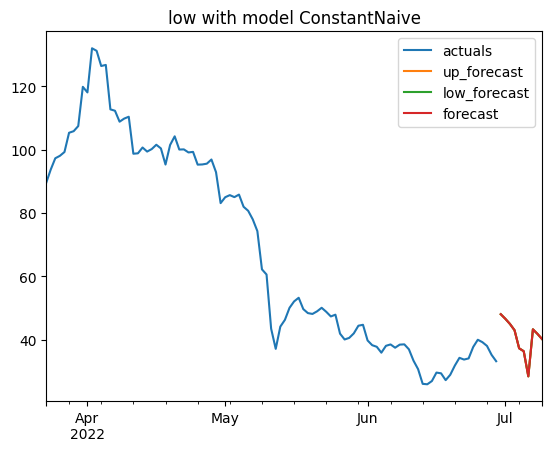

In [51]:
prediction = model.predict()
prediction.plot(model.df_wide_numeric,
series=model.df_wide_numeric.columns[0])
print(model)
forecasts_df = prediction.forecast
forecasts_up, forecasts_low = prediction.upper_forecast, prediction.lower_forecast
model_results = model.results()
validation_results = model.results("validation")

In [21]:
#lalu untuk mendeteksi anomaly kami memanfaatkan algoritma isolationforest dan dibawah ini adalah model algoritmanya
from sklearn.ensemble import IsolationForest
model=IsolationForest(n_estimators=1000,max_samples='auto',contamination=float(0.2),max_features=1.0)
model.fit(df_MinMaxScaler[["high"]])
#untuk kolom yang kita pakai untuk algoritma ini adalah high krn ingin mendeteksi kenaikan tidak wajar

/opt/homebrew/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


IsolationForest(contamination=0.2, n_estimators=1000)

In [22]:
#disini kami mendefinisikan scores dan anomaly dr decision dan predict pada kolom high
df_MinMaxScaler['scores']=model.decision_function(df_MinMaxScaler[['high']])
df_MinMaxScaler['anomaly']=model.predict(df_MinMaxScaler[['high']])
df_MinMaxScaler
#dan disini kita dapat melihat jika ada penambahan kolom baru yaitu scores dan anomaly berisi data result algoritma
#jika menunjukan angka 1 berarti tidak terdapat anomaly atau berarti datanya wajar 
#jika menunjukan -1 berarti terdapat anomaly atau berarti ada kenaikan yang tidak wajar 

,timestamp,open,high,low,close,volume,scores,anomaly
0,0.967011,0.050963,0.028128,0.055789,0.030619,0.000000,0.002698,1
1,0.933689,0.062667,0.044985,0.068606,0.050466,0.197204,0.049681,1
2,0.900367,0.092278,0.079010,0.087567,0.063165,0.186568,0.084926,1
3,0.867044,0.100467,0.091242,0.114122,0.092349,0.179348,0.101719,1
4,0.833722,0.126630,0.101509,0.125342,0.099695,0.154037,0.092824,1
...,...,...,...,...,...,...,...,...
95,0.866045,0.675967,0.679481,0.691277,0.722731,0.122253,0.085543,1
96,0.832722,0.648024,0.645770,0.679890,0.676320,0.077191,0.124051,1
97,0.799400,0.680711,0.657384,0.672644,0.646379,0.204620,0.097114,1
98,0.766078,0.611855,0.646859,0.638726,0.679619,0.315259,0.124734,1


In [23]:
#disini kami melakukan import result kedalam csv untuk melakukan evaluasi lebih lanjut
dfa.to_csv("/Users/Adefebrian/aa.csv")

In [24]:
#dan dibawah ini kita dapat melihat presentase outlier atau anomaly dari data yang sudah kita proses dengan algoritma isolation forest
df_MinMaxScaler[df_MinMaxScaler['anomaly']== -1].shape
#dapat disimpulkan dari 100 rows dan 8 kolom terdapat 20 data anomaly jika kita simpulkan dari 100 data dan hanya ada 20 data saja yang anomaly berarti tergolong aman

(20, 8)

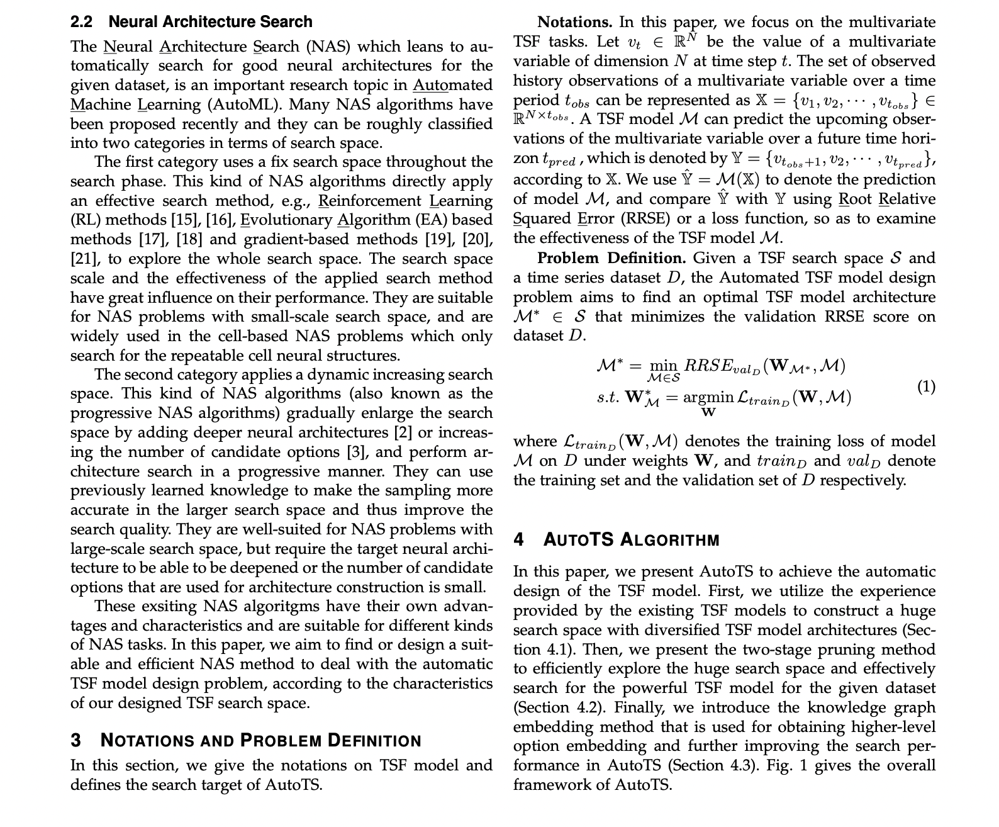

In [25]:
#sedangkan untuk bagian ini hanyalah beberapa refrensi paper yang kami jadikan sebagai acuan
from IPython.display import Image
Image(filename='/Users/Adefebrian/autots.png') 
#paper > AutoTS: Automatic Time Series Forecasting Model Design Based on Two-Stage Pruning
#source : https://arxiv.org/pdf/2203.14169.pdf 

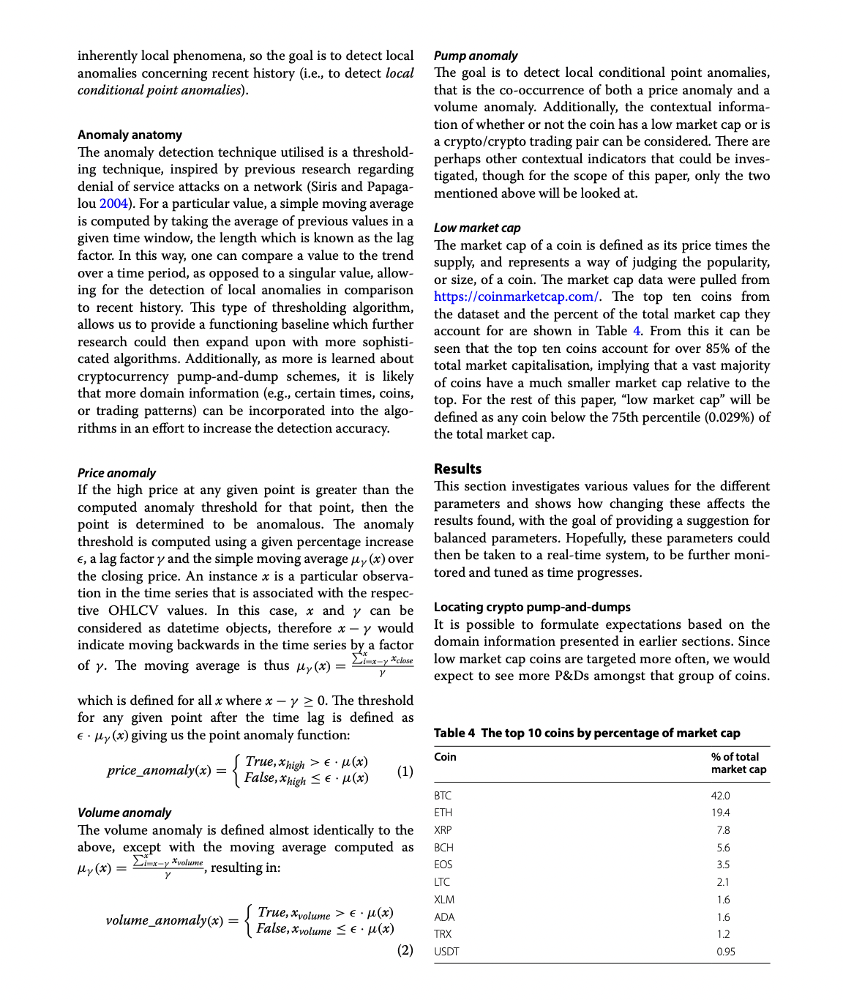

In [26]:
#untuk bagian ini hanyalah beberapa refrensi paper yang kami jadikan sebagai acuan
Image(filename='/Users/Adefebrian/anomaly.png') 
#paper anomaly 
#source : https://crimesciencejournal.biomedcentral.com/track/pdf/10.1186/s40163-018-0093-5.pdf

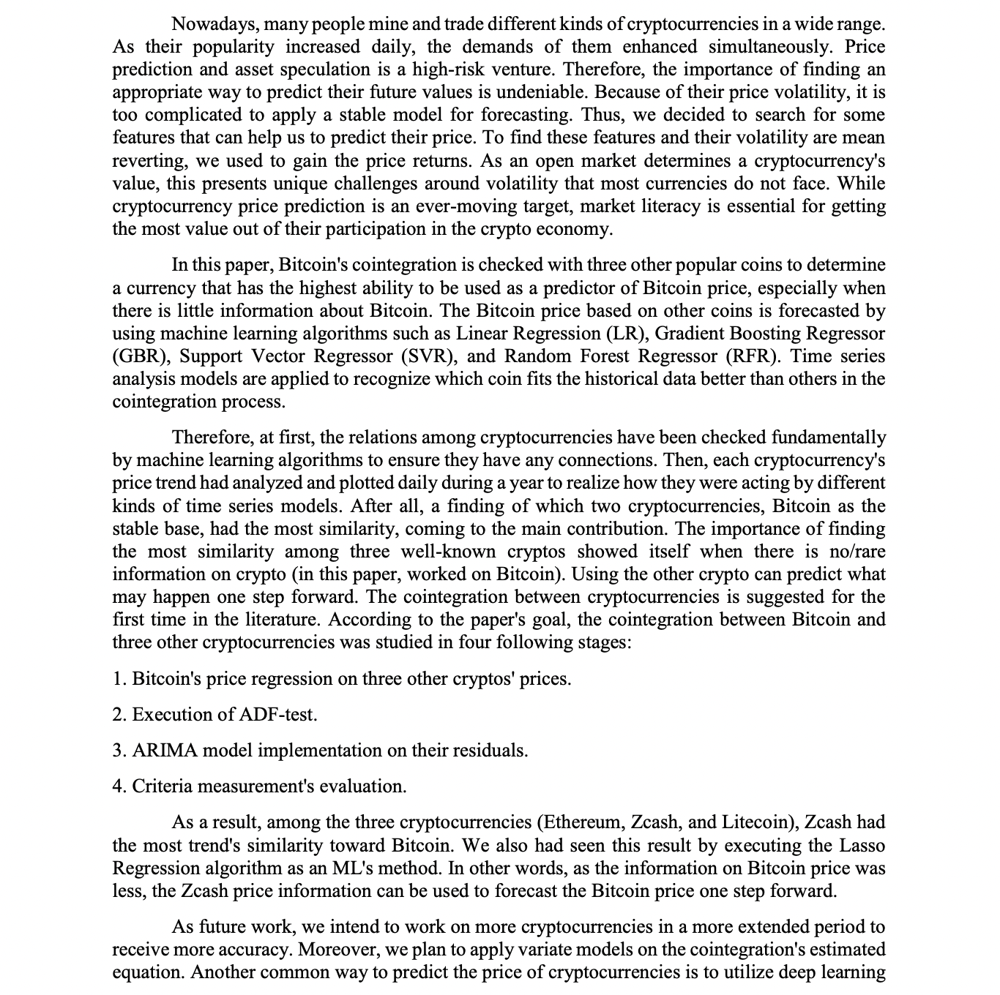

In [27]:
#untuk bagian ini juga sama hanyalah beberapa refrensi paper yang kami jadikan sebagai acuan
Image(filename='/Users/Adefebrian/timeseries.png') 
#paper forecasting 
#source : http://scientiairanica.sharif.edu/article_22083_75ba497cd2315b88fc164a99071e9113.pdf

In [ ]:
#refrensi paper lain
#1. https://crimesciencejournal.biomedcentral.com/track/pdf/10.1186/s40163-018-0093-5.pdf
#2. https://arxiv.org/pdf/2203.14169.pdf
#3. https://munin.uit.no/bitstream/handle/10037/15733/thesis.pdf?sequence=2&isAllowed=y
#4. https://ieeexplore.ieee.org/abstract/document/8705858
#5. https://arxiv.org/pdf/2003.06551.pdf
#6. https://arxiv.org/pdf/2105.00733.pdf
#7. https://arxiv.org/abs/1611.03941
#8. https://link.springer.com/chapter/10.1007/978-3-030-65745-1_8
#9. https://trepo.tuni.fi/handle/10024/118552
#10. https://dl.acm.org/doi/abs/10.1145/3477314.3507185?casa_token=hMyWvYinkJ4AAAAA:szryx0tPy8kKqVL_JWgIx4u_fgEymGQDArzrXgrMOxtV0r16AcFJ2YUGCboQdGNDv0nEpvQXlgxY0A